# Final Group Project - New York Airbnb Analytics

Eunice  
Fandi   
Pascal   
Shivangi   
Vivek   

#  Framing the Problem

Airbnb operates an online marketplace for lodging, primarily homestays for vacation rentals, and tourism activities. It allows people (hosts) to list their propoerties for short-term rentals and earns money through the commission for each booking. The business model is based on the idea that these rentals are cheaper than hotels, making the company a threat to hotel industry. The value proposition to hosts is side income, while for the guests it is cheaper accomodation. 

The market of these short-term rentals in a city is highly competitive because renters are presented with a broad range of selection of listings for their specific criteria. Since Airbnb is a marketplace, the dynamics of marketplace have a huge influence on the the amount a host can charge on a nightly basis. This is in fact one of the biggest challenges for the hosts: deciding the prices for their listing. If they charge above the market place, they will lose out on revenue as the renters will most liklely find another affordable alternatives. If the price is set too low, then they again lose out on profits. Additionally, renters may lose out on the opprtunity to live at a great place. 

For this project, our goal is build a regression model that can accurately predict the price of the listing, which will help hosts to decide what price they should list their property at. Additionally, the machine learning algorithms will also provide insighst into what factors influence the pricing of these rentals. If they are something that can be controlled by the hosts, then they can use the insghts from this analysis to improve those factors and provide better accomodation to guests. For the scope of this project, we will only be looking at properties in New York considering that New York is a highly competitive marketplace for Airbnb. The dataset that we have used is from the website below:

Hypothesis:

Link to the dataset:http://insideairbnb.com/get-the-data.html

**This project was started afresh and was not continuation from first semester


# #Setup
**IMPORT PACKAGES**

In [411]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

#Pandas Profiling
#!pip install pandas_profiling
import pandas_profiling

# To plot pretty figures
#!pip install -U seaborn
import seaborn as sns
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
import gc
warnings.simplefilter(action='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
%matplotlib inline

#Display multiple outputs per cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


# 1) Data Acquisition

**IMPORT DATA**

In [412]:
import pandas as pd
df1=pd.read_csv('http://data.insideairbnb.com/united-states/ny/new-york-city/2021-02-04/data/listings.csv.gz')

In [413]:
df1.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2595,https://www.airbnb.com/rooms/2595,20210204180331,2021-02-05,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,...,10.0,10.0,9.0,NaN,f,2,2,0,0,0.35
1,3831,https://www.airbnb.com/rooms/3831,20210204180331,2021-02-05,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,...,10.0,10.0,10.0,NaN,f,1,1,0,0,4.99
2,5121,https://www.airbnb.com/rooms/5121,20210204180331,2021-02-05,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,...,10.0,9.0,9.0,NaN,f,1,0,1,0,0.35
3,5178,https://www.airbnb.com/rooms/5178,20210204180331,2021-02-05,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",https://a0.muscache.com/pictures/12065/f070997...,8967,https://www.airbnb.com/users/show/8967,...,9.0,10.0,9.0,NaN,f,1,0,1,0,3.31
4,5203,https://www.airbnb.com/rooms/5203,20210204180331,2021-02-06,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,https://a0.muscache.com/pictures/103776/b37157...,7490,https://www.airbnb.com/users/show/7490,...,10.0,10.0,10.0,NaN,f,1,0,1,0,0.85


In [414]:
df1.shape 

(37012, 74)

**DATA DICTIONARY**

Since there was no official data dictionary, we used Airbnb's webiste to interpret some of the features. Considering there are 74 variables including a lot of variables such a different ids and urls and granular information regarding host (id, url, picture_url etc.) that would not be used in the analysis, we decided to drop some of these. We have only provided dictionary for the variables that we will be using and are not explainable by their names.

In [348]:
df1.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [415]:
df1 = df1.drop(columns = ['id', 'listing_url', 'scrape_id',
       'picture_url', 'host_id', 'host_url', 'host_name','host_location',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'neighbourhood',
       'bathrooms', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability',
       'calendar_last_scraped', 'number_of_reviews_l30d', 'license',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms'])

df1.head()

,last_scraped,name,description,neighborhood_overview,host_since,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month
0,2021-02-05,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,2008-09-09,A New Yorker since 2000! My passion is creatin...,within a few hours,93%,26%,f,...,2019-11-04,94.0,9.0,9.0,10.0,10.0,10.0,9.0,f,0.35
1,2021-02-05,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,2008-12-07,Laid-back Native New Yorker (formerly bi-coast...,within a few hours,98%,93%,f,...,2021-01-27,90.0,10.0,9.0,9.0,10.0,10.0,10.0,f,4.99
2,2021-02-05,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,2009-02-03,"I am an artist(painter, filmmaker) and curato...",NaN,NaN,NaN,f,...,2019-12-02,90.0,8.0,8.0,10.0,10.0,9.0,9.0,f,0.35
3,2021-02-05,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",2009-03-03,I used to work for a financial industry but no...,within a day,100%,100%,f,...,2020-09-25,84.0,9.0,8.0,9.0,9.0,10.0,9.0,f,3.31
4,2021-02-06,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,2009-02-05,Welcome to family life with my oldest two away...,NaN,NaN,NaN,f,...,2017-07-21,98.0,10.0,10.0,10.0,10.0,10.0,10.0,f,0.85


In [350]:
df1.columns

Index(['last_scraped', 'name', 'description', 'neighborhood_overview',
       'host_since', 'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'reviews_per_month'],
      dt

The first few variables are related to host, which include his/her details like their response rate, information regarding their profile. Then the next few variables are regarding the property itself. The next few variables are not very intuitive and their description is given below: 

accommodates - how many people the property accommodates
<br>minimum_nights - number of minimum nights guests have to stay 
<br>maximum_nights - number of maximum nights guests are allowed to stay
<br>number_of_reviews_ltm - Number of reviews in last 12 months
<br>number_of_reviews_l30d - umber of reviews in last 30 days
<br>first_review - Date first review was posted 
<br>last_review - Date last review was posted 
<br>review_scores_rating - Rating of host for overall experience
<br>review_scores_accuracy - Rating of host for accuracy of listings
<br> review_scores_cleanliness - Rating of host for cleanliness
<br>review_scores_checkin - Rating of host for checking experience
<br> review_scores_communication - Rating of host for communication
<br>review_scores_location - Rating score for location
<br>review_scores_value - Rating for property's worth (value)
<br>instant_bookable - If property can be instantly booked  (i.e. booked straight away, without having to message the host first and wait to be accepted)
<br>reviews_per_month - Reviews per month

# 2 - Exploratory Data Analysis

## A) Data Exploration

**CHECK DATA TYPES**

In [62]:
df1.dtypes

last_scraped                     object
name                             object
description                      object
neighborhood_overview            object
host_since                       object
host_about                       object
host_response_time               object
host_response_rate               object
host_acceptance_rate             object
host_is_superhost                object
host_total_listings_count       float64
host_verifications               object
host_has_profile_pic             object
host_identity_verified           object
neighbourhood_cleansed           object
neighbourhood_group_cleansed     object
latitude                        float64
longitude                       float64
property_type                    object
room_type                        object
accommodates                      int64
bathrooms_text                   object
bedrooms                        float64
beds                            float64
amenities                        object


We observe that, the following columns need to be changed to the correect data type.
<br> - first_review, host_since, last_review --> changed to 'date'.
<br>- host_response_rate, host_acceptance_rate, price --> changed to a 'numerical' column

In [416]:
#change variables to 'date' type
df1['host_since']=pd.to_datetime(df1['host_since'])
df1['first_review']=pd.to_datetime(df1['first_review'])
df1['last_review']=pd.to_datetime(df1['last_review'])
df1.dtypes

last_scraped                            object
name                                    object
description                             object
neighborhood_overview                   object
host_since                      datetime64[ns]
host_about                              object
host_response_time                      object
host_response_rate                      object
host_acceptance_rate                    object
host_is_superhost                       object
host_total_listings_count              float64
host_verifications                      object
host_has_profile_pic                    object
host_identity_verified                  object
neighbourhood_cleansed                  object
neighbourhood_group_cleansed            object
latitude                               float64
longitude                              float64
property_type                           object
room_type                               object
accommodates                             int64
bathrooms_tex

In [417]:
#change variables to numerical
#get all the non-null values and Convert the object datatype to numerical datatype: host_response_rate, host_acceptance_rate
df1['host_response_rate'] = df1['host_response_rate'].astype(str).str.replace('%', '').astype(float)
df1['host_acceptance_rate'] = df1['host_acceptance_rate'].astype(str).str.replace('%', '').astype(float)
df1['price'] = df1['price'].str.replace(',', '').str.replace('$', '').astype(float)

TypeError: Cannot cast Index to dtype int32

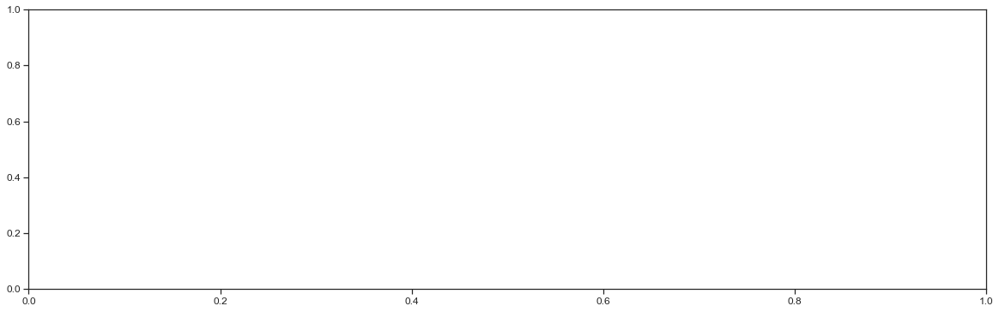

In [353]:
df1.dtypes.value_counts().sort_values().plot(kind='barh',
                                            figsize=(20, 6),
                                            fontsize=16,
                                           color="midnightblue")

plt.title('Number of columns by data types', fontsize=18)
plt.xlabel('Number of columns', fontsize=16)
plt.ylabel('Data type', fontsize=16)

**SUMMARY STATISTICS**

In [ ]:
df1.describe()

**PANDAS PROFILING**

In [131]:
#Generate a HTML report
profile = df1.profile_report(title='Pandas Profiling Report')
#profile

profile.to_file(output_file="profile_report_output.html")

Summarize dataset:   0%|          | 0/58 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Insights from the profile report: 
<br>1. A lot of variables regarding host have missing values; bathrooms variables is all null values
<br>2. Room type and propert type are highly correlated 
<br>3. Avialbility_30, Availability_60 and Availability_90 are highly correlated 

**SOME DATA CLEANING**

A lot of variables include text, hence, they will be need to processed by either modifying them or creating new variables out of them. Most of these columns included description regarding the property or neighbourhood or about the host. Some columns are just dates so having differences between those dates would be more useful. 

In [418]:
#=======================================================Data Cleansing===================================================
#Only pick the Airbnb apartment with reviews
#df1=df1[df1['number_of_reviews'].astype(int)>0]

#Only pick the Airbnb apartment with price
#df1=df1[df1['price']>0]

#Only pick the Airbnb with the answer(t/f) for "host_is_superhost"
#df1=df1[df1['host_is_superhost'].apply(lambda x: len(str(x))==1)]

#Drop other answer except f/t in "instant_bookable"
#df1=df1[df1['instant_bookable'].isin(['f','t'])]

#To drop the review score which lower than 21 (potential outliers)
#df1=df1[df1['review_scores_rating']>21]

#Replace all the blank cell with NaN value
df1=df1.replace('',np.NaN)

#========================================================Add new features===============================================

#Get the length of the sentence in following five columns (number of words)
df1['name_length']  = df1['name'].apply(lambda x: len(str(x).split()))
df1['description_length']=df1['description'].apply(lambda x: len(str(x).split()))
df1['host_about_length']=df1['host_about'].apply(lambda x: len(str(x).split()))
df1['verifications_length']=df1['host_verifications'].apply(lambda x: len(str(x).split(',')))
df1['amenities_length']=df1['amenities'].apply(lambda x: len(str(x).split(',')))

#Get the difference between the "last_scraped" with the following dates (in days)
df1['host_since_days'] = (pd.to_datetime(df1['last_scraped'])-pd.to_datetime(df1['host_since'])).dt.days
df1['first_review_days'] = (pd.to_datetime(df1['last_scraped'])-pd.to_datetime(df1['first_review'])).dt.days
df1['last_review_days'] = (pd.to_datetime(df1['last_scraped'])-pd.to_datetime(df1['last_review'])).dt.days

#drop 'last_scraped, host_since, first_reviews, last_review'
df1 = df1.drop(columns = ['last_scraped', 'host_since','first_review','last_review'])
                          
#Get the new column to express the price per accommodate
df1['price_per_accommodates']=df1['price']/df1['accommodates'].astype(float)
#=====================================================Change the data type=============================================
#Convert the categorical columns to dummified columns
list_col=['host_is_superhost','host_identity_verified','instant_bookable', 'host_has_profile_pic']
for i in list_col:
    df1[i] = np.where(df1[i]== 't', 1, 0)

**CHECK MISSING VALUES**

In [419]:
def missing_values(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(columns={
        0: 'Missing Values',
        1: '% of Total Values'
    })
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:, 1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)
    print("Dataframe has " + str(df.shape[1]) + " columns.")
    print("There are " + str(mis_val_table_ren_columns.shape[0]) +
          " columns that have missing values.")
    
    return mis_val_table_ren_columns

# Missing values statistics
miss_values = missing_values(df1)
miss_values

Dataframe has 50 columns.
There are 23 columns that have missing values.


,Missing Values,% of Total Values
host_response_time,18507,50.0
host_response_rate,18507,50.0
host_about,14844,40.1
host_acceptance_rate,14633,39.5
neighborhood_overview,13683,37.0
review_scores_value,10272,27.8
review_scores_location,10272,27.8
review_scores_checkin,10271,27.8
review_scores_accuracy,10259,27.7
review_scores_communication,10257,27.7


<AxesSubplot:>

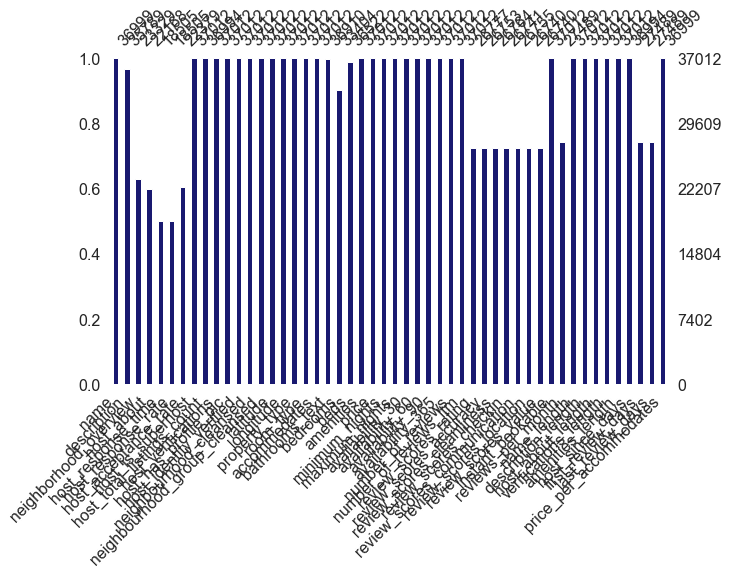

In [420]:
import missingno as msno
#msno.matrix(df.sample(500), figsize=(12,8))
msno.bar(df1, figsize=(10,6), color='midnightblue')

**TARGET VARIABLE**
Check distribution of 'Price' variable

In [421]:
#df1['price'].value_counts().plot(kind='bar', color='midnightblue')

<Figure size 720x504 with 0 Axes>

<AxesSubplot:xlabel='price', ylabel='Density'>

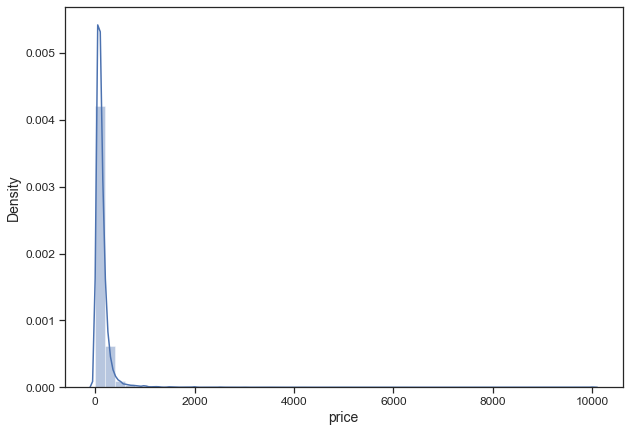

In [422]:
plt.figure(figsize=(10,7))
sns.distplot(df1.price)

The target variable is very heavily right skewed!

**CORRELATIONS between predictors and target variable**

In [ ]:
corr = df1.corr()['price'].sort_values()
corr

**There is no multicollinearity between the target variable and the predictors. All correlation values are below 0.8**

**CATEGORICAL VARIABLES**

**Number of categories in each categorical variable**

In [163]:
df1.select_dtypes('object').apply(pd.Series.nunique, axis=0)

name                            35912
description                     33912
neighborhood_overview           19385
host_about                      15481
host_response_time                  4
host_verifications                524
neighbourhood_cleansed            220
neighbourhood_group_cleansed        5
property_type                      75
room_type                           4
bathrooms_text                     36
amenities                       31671
dtype: int64

In [164]:
df1['host_response_time'].value_counts()

within an hour        10143
within a few hours     3937
within a day           3039
a few days or more     1386
Name: host_response_time, dtype: int64

In [165]:
df1['neighbourhood_group_cleansed'].value_counts()

Manhattan        16553
Brooklyn         14474
Queens            4704
Bronx              992
Staten Island      289
Name: neighbourhood_group_cleansed, dtype: int64

In [166]:
df1['property_type'].value_counts().head(50)

Entire apartment                      15506
Private room in apartment             12037
Private room in house                  1897
Private room in townhouse              1044
Entire condominium                      983
Entire house                            949
Entire loft                             628
Entire townhouse                        589
Shared room in apartment                501
Private room in condominium             477
Room in hotel                           371
Private room in loft                    351
Room in boutique hotel                  336
Entire serviced apartment               301
Entire guest suite                      231
Private room in guest suite             103
Shared room in house                     80
Private room in hostel                   52
Room in aparthotel                       51
Entire guesthouse                        45
Room in serviced apartment               43
Private room in serviced apartment       38
Shared room in loft             

In [142]:
df1['room_type'].value_counts()

Entire home/apt    19397
Private room       16630
Shared room          686
Hotel room           299
Name: room_type, dtype: int64

### Some Data Transformation
To make visualization easier and more insightful

**BATHROOM TEXT**

Deriving the number and type of bathroom from the 'bathroom_text' variable

In [423]:
df1['bathrooms_text']=df1['bathrooms_text'].astype(str)
df1['bathrooms_text']=df1['bathrooms_text'].replace('nan','nan nan')

df1['bathrooms_list']  = df1['bathrooms_text'].apply(lambda x: (x.split(" ", 1)))
df1['bathrooms_list']

new_val=[]
for lst in np.array(df1['bathrooms_list']):
    if len(lst)!=2:
        lst.append(" ")
    new_val.append(lst)
    
df1['bathrooms_list']=new_val
list_num=[]
list_name=[]
for i in np.array(df1['bathrooms_list']):
    list_num.append(i[0])
    list_name.append(i[1])
df1['num_bath']=list_num
df1['name_bath']=list_name

df1=df1.drop('bathrooms_list',axis=1)

0               [1, bath]
1               [1, bath]
2              [nan, nan]
3               [1, bath]
4        [1, shared bath]
               ...       
37007           [1, bath]
37008    [1, shared bath]
37009    [1, shared bath]
37010    [1, shared bath]
37011    [1, shared bath]
Name: bathrooms_list, Length: 37012, dtype: object

In [424]:
df1['num_bath'].value_counts().head(20)

#Replace some values to make them numerical
df1['num_bath'] = df1['num_bath'].replace({'Half-bath': 0.5, 'Shared':0.5, 'Private':1})

df1['num_bath'].value_counts().head(20)

1            30654
2             3245
1.5           1802
2.5            400
3              322
0              164
nan            102
4               97
3.5             74
Half-bath       36
4.5             25
Shared          18
Private         17
5               16
6               15
8                9
5.5              5
6.5              4
7.5              3
7                3
Name: num_bath, dtype: int64

1       30654
2        3245
1.5      1802
2.5       400
3         322
0         164
nan       102
4          97
3.5        74
0.5        54
4.5        25
1          17
5          16
6          15
8           9
5.5         5
6.5         4
7           3
7.5         3
15.5        1
Name: num_bath, dtype: int64

In [425]:
df1['name_bath'].value_counts().head(20)

#replace some duplicate categories
df1['name_bath'] = df1['name_bath'].replace({'shared baths': 'shared bath', 'baths':'private bath', 'bath':'private bath'})

df1['name_bath'].value_counts().head(20)

bath            19138
shared bath      9420
baths            3992
shared baths     2193
private bath     2096
nan               102
                   36
half-bath          35
Name: name_bath, dtype: int64

private bath    25226
shared bath     11613
nan               102
                   36
half-bath          35
Name: name_bath, dtype: int64

In [426]:
df1.property_type.replace({
    'Tiny house': 'House',                           
'Shared room in townhouse':'Townhouse',
'Private room in earth house'           :'Other',
'Shared room in serviced apartment'     :'Apartment',
'Private room in bungalow'              :'Bunglow',
'Entire cottage'                        :'Other',
'Houseboat'                             :'Other',
'Entire villa'                          :'House',
'Boat'                                  :'Other',
'Entire home/apt'                       :'Other',
'Private room in casa particular'       :'Other',
'Private room in floor'                 :'Other',
'Shared room in bed and breakfast'      :'Other',
'Private room in barn'                  :'Other',
'Private room in castle'                :'Other',
'Private room in cottage'               :'Other',
'Barn'                                 :'Other',
'Cave'                                  :'Other',
'Private room in cabin'                 :'Other',
'Shared room in guest suite':'Other',
'Private room in dome house'  :'Other',
'Shared room in guesthouse'   :'Other',
'Private room in dorm'        :'Other',
'Lighthouse'                  :'Other',
'Shared room in island'       :'Other',
'Room in resort'              :'Other',
'Bus'                         :'Other',
'Shared room in earth house'  :'Other',
'Private room in camper/rv'   :'Other',
'Shared room in bungalow'     :'Other',
'Private room in train'       :'Other',
'Private room in farm stay'   :'Other',
'Private room in in-law'  :'Other',
'Private room in lighthouse'  :'Other',          
'Private room in tent'  :'Other',     
'Entire bed and breakfast'  :'Other',
'Room in hostel'   :'Other',
'Shared room in floor':'Other',
'Private room in bed and breakfast': 'Room in bed and breakfast',
'Entire place':'House',                                         
'Shared room in condominium': 'Condo',
'Private room' :'Private room in house',                     
'Camper/RV':'Other',
'Private room in villa' :  'Villa',
'Entire bungalow': 'Bunglow',
'Entire floor':'House',
'Entire resort': 'Other',
'Private room in tiny house':'Other'
    
    }, inplace=True)


In [427]:
df1['property_type'].value_counts()

Entire apartment                      15506
Private room in apartment             12037
Private room in house                  1918
Private room in townhouse              1044
Entire condominium                      983
Entire house                            949
Entire loft                             628
Entire townhouse                        589
Shared room in apartment                501
Private room in condominium             477
Room in hotel                           371
Private room in loft                    351
Room in boutique hotel                  336
Entire serviced apartment               301
Entire guest suite                      231
Private room in guest suite             103
Other                                   103
Shared room in house                     80
House                                    57
Private room in hostel                   52
Room in aparthotel                       51
Entire guesthouse                        45
Room in serviced apartment      

**SENTIMENT SCORE OF HOST AND PROPERTY DESCRIPTIONS**

In [428]:
#!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    return score['compound']

In [429]:
dfa=df1[['name','description','neighborhood_overview','host_about']]
dfa['name'] = dfa['name'].fillna("Unknown")
dfa['description'] = dfa['description'].fillna("Unknown")
dfa['neighborhood_overview'] = dfa['neighborhood_overview'].fillna("Unknown")
dfa['host_about'] = dfa['host_about'].fillna("Unknown")

In [430]:
dfa['name_sentiment'] = dfa.apply(lambda row : sentiment_analyzer_scores(row['name']), axis = 1)
dfa['description_sentiment'] = dfa.apply(lambda row : sentiment_analyzer_scores(row['description']), axis = 1)
dfa['neighborhood_sentiment'] = dfa.apply(lambda row : sentiment_analyzer_scores(row['neighborhood_overview']), axis = 1)
dfa['hostabout_sentiment'] = dfa.apply(lambda row : sentiment_analyzer_scores(row['host_about']), axis = 1)

In [431]:
dfa['sentiment'] = (dfa['name_sentiment']+dfa['description_sentiment']+dfa['neighborhood_sentiment']+dfa['hostabout_sentiment'])/4
dfa['sentiment']

0        0.667450
1        0.533675
2        0.488675
3        0.227500
4        0.592700
           ...   
37007    0.000000
37008    0.114700
37009    0.760800
37010    0.860875
37011    0.437025
Name: sentiment, Length: 37012, dtype: float64

In [432]:
#Add the sentiment values into the dataframe
df1['total_sentiment'] = np.NaN
df1['name_sentiment'] = np.NaN
df1['description_sentiment'] = np.NaN
df1['neighborhood_sentiment'] = np.NaN
df1['hostabout_sentiment'] = np.NaN
df1['total_sentiment'].loc[dfa.index] = dfa['sentiment']
df1['name_sentiment'].loc[dfa.index] = dfa['name_sentiment']
df1['description_sentiment'].loc[dfa.index] = dfa['description_sentiment']
df1['neighborhood_sentiment'].loc[dfa.index] = dfa['neighborhood_sentiment']
df1['hostabout_sentiment'].loc[dfa.index] = dfa['hostabout_sentiment']
df1

,name,description,neighborhood_overview,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,...,first_review_days,last_review_days,price_per_accommodates,num_bath,name_bath,total_sentiment,name_sentiment,description_sentiment,neighborhood_sentiment,hostabout_sentiment
0,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,A New Yorker since 2000! My passion is creatin...,within a few hours,93.0,26.0,0,6.0,"['email', 'phone', 'reviews', 'offline_governm...",...,4094.0,459.0,50.000000,1,private bath,0.667450,0.0000,0.9931,0.7089,0.9678
1,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,Laid-back Native New Yorker (formerly bi-coast...,within a few hours,98.0,93.0,0,1.0,"['email', 'phone', 'reviews', 'offline_governm...",...,2320.0,9.0,24.333333,1,private bath,0.533675,0.0000,0.9764,0.8201,0.3382
2,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,"I am an artist(painter, filmmaker) and curato...",NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",...,4271.0,431.0,30.000000,nan,nan,0.488675,0.0000,0.9825,0.0000,0.9722
3,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",I used to work for a financial industry but no...,within a day,100.0,100.0,0,1.0,"['email', 'phone', 'facebook', 'reviews']",...,4293.0,133.0,39.500000,1,private bath,0.227500,0.0000,0.9100,0.0000,0.0000
4,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,Welcome to family life with my oldest two away...,NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'google', 'revi...",...,4170.0,1296.0,75.000000,1,shared bath,0.592700,0.4019,0.9873,0.0000,0.9816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37007,Cozy One-Bedroom with Full Kitchen Near Manhattan,NaN,NaN,NaN,within an hour,100.0,100.0,0,2.0,"['phone', 'offline_government_id', 'government...",...,NaN,NaN,30.000000,1,private bath,0.000000,0.0000,0.0000,0.0000,0.0000
37008,Grand Concourse Gem,NaN,NaN,"Native New Yorker\nEclectic dabbler (writer, p...",NaN,NaN,0.0,0,1.0,"['email', 'phone', 'offline_government_id', 'g...",...,NaN,NaN,520.000000,1,shared bath,0.114700,0.4588,0.0000,0.0000,0.0000
37009,Natural Light-Filled Home in Upper East Side,"Private room with Queen bed in a 4 bedroom, 4 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,NaN,NaN,63.000000,1,shared bath,0.760800,0.3612,0.8555,0.9442,0.8823
37010,Spacious Living in the Heart of Upper East Side,"Private room with Queen bed in a 2 bedroom, 1 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,NaN,NaN,67.000000,1,shared bath,0.860875,0.6369,0.9801,0.9442,0.8823


**AMENITIES**

Amenities are all present in a list. Although we have calculated the length of list of amenities in a list, it would be useful to see what amenities are usually listed and make those categorical variables.

In [433]:
#creating set of all amenties
amenities = list(df1.amenities)
amenities_list = " ".join(amenities)
amenities_list = amenities_list.replace('[', '')
amenities_list = amenities_list.replace(']', ',')
amenities_list= amenities_list.replace('"', '')
amenities_set = [x.strip() for x in amenities_list.split(',')]
amenities_set = set(amenities_set)
amenities_set

{'',
 '1 space',
 '100\\ HDTV with Netflix',
 '120\\ HDTV with Amazon Prime Video',
 '120\\ HDTV with Apple TV',
 '12\\ TV',
 '1802 Beekman toiletries',
 '2 burner induction cooktop.  We provide pots and pans. induction stove',
 '2 spaces',
 '2-5 years old',
 '20\\ TV with standard cable',
 '24-hour fitness center',
 '24\\ HDTV with Chromecast',
 '30\\ HDTV',
 '32\\ HDTV',
 '32\\ HDTV with Amazon Prime Video',
 '32\\ HDTV with Chromecast',
 '32\\ HDTV with HBO Max',
 '32\\ HDTV with Netflix',
 '32\\ HDTV with Roku',
 '32\\ TV',
 '36\\ TV',
 '36\\ TV with Chromecast',
 '37\\ HDTV with Netflix',
 '37\\ TV with Amazon Prime Video',
 '39\\ HDTV',
 '40\\ HDTV',
 '40\\ HDTV with Apple TV',
 '40\\ HDTV with Chromecast',
 '40\\ HDTV with Netflix',
 '40\\ HDTV with Roku',
 '40\\ HDTV with standard cable',
 '40\\ TV with Netflix',
 '40\\ TV with premium cable',
 '42\\ HDTV with Amazon Prime Video',
 '42\\ HDTV with Netflix',
 '42\\ HDTV with premium cable',
 '42\\ TV',
 '43\\ HDTV',
 '43\\ HDTV 

In the list above, some amenities are more important than others (e.g. a parking lot is more important that a shampoo). Based on research and personal experiences, some of the most important amentities will be selected. Some of the amenities such as wifi, stove top are standard across all listings so they weren't included in the list

The amenities chosen are (slashes indicate those categories that can be combined):

<br>Air conditioning/Central air conditioning
<br>BBQ grill
<br>Patio 
<br>beachfront/lake access
<br>Breakfast/Complimentary breakfast buffet/ Complimentary continental breakfast/ Complimentary hot breakfast
<br>Cable TV/TV
<br>Coffee maker/ Keurig coffee machine
<br>Breakfast/Complimentary breakfast buffet/ Complimentary continental breakfast/ Complimentary hot breakfast
<br>Cooking basics
<br>Dishwasher/Dryer/Washer
<br>Gym/Private gym/Shared gym/ Shared gym in building/
<br>Free parking on premises/Free street parking/outdoor parking/paid parking off premises/paid parking on premises
<br>Hot tub/Private hot tub/shared hot tub/Shared pool/Shared sauna/private hot tub
<br>Long term stays allowed
<br>Pets allowed
<br>Private entrance
<br>Safe/security system
<br>Microwave

In [365]:
import requests
import nltk
import nltk.corpus
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [366]:
df = df1[['amenities']]
df.head()

df = df[df['amenities'].notnull()]

#expand contraction words
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

df['pros1'] = df.apply(lambda row : decontracted(row['amenities']), axis = 1)

#Tokenization the comments column
def token_(x):
    token = word_tokenize(x)
    return token
df['pros_token'] = df.apply(lambda row : token_(row['pros1']), axis = 1)

# Lower Casing the Tokenized comments
def lower_case(x):
    ret = []
    for words in x:
        words = words.lower()
        ret.append(words)
    return ret 
df['pros_token'] = df.apply(lambda row : lower_case(row['pros_token']), axis = 1)

# Removing Punctuation
import re 
punctutation = re.compile(r'[-.?!,:;()%\/|0-9""]')
def post_punctutation(x):
    ret = []
    for words in x:
        item = punctutation.sub("",words)
        if len(item)>0:
            ret.append(item)
    return ret 
df['pros_token'] = df.apply(lambda row : post_punctutation(row['pros_token']), axis = 1)
#len(df['Comment_token_punct'][0]), len(df['Comment_token'][0])

#Stopwords
stop_words = set(stopwords.words('english'))
def remove_stopwords(x):
    filtered_sentence = []  
    for w in x:
        if w not in stop_words:
            filtered_sentence.append(w)
    return filtered_sentence
df['pros_stopwords'] = df.apply(lambda row : remove_stopwords(row['pros_token']), axis = 1)
#len(df['Comment_token_punct_stopwords'][0]),len(df['Comment_token_punct'][0]),

#POS Tagging
nltk.download('averaged_perceptron_tagger')
df['pros_tags'] = df['pros_stopwords'].apply(nltk.tag.pos_tag)

def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
df['wordnet_pos'] = df['pros_tags'].apply(lambda x: [(word, get_wordnet_pos(pos_tag)) for (word, pos_tag) in x])

wnl = WordNetLemmatizer()
df['lemmatized'] = df['wordnet_pos'].apply(lambda x: [wnl.lemmatize(word, tag) for word, tag in x])

# ALl the duplicate words will be removed from the text/comments including all the adjectives and verbs.
def unique_(test_list):
    res = [] 
    for i in test_list: 
        if i not in res: 
            res.append(i) 
    return res
df['pros_unique'] = df.apply(lambda row : unique_(row['lemmatized']), axis = 1)
#len(df['Comment_token_punct_stopwords_unique'][0]),len(df['lemmatized'][0]),

#select nouns only
df['nouns'] = df['wordnet_pos'].apply(lambda x: [word for (word, pos) in x if pos[0] == 'n'])

text_list=df['nouns'].tolist()
#print(text_list[0])


,amenities
0,"[""Refrigerator"", ""Air conditioning"", ""Baking s..."
1,"[""Refrigerator"", ""Microwave"", ""Shampoo"", ""High..."
2,"[""Wifi"", ""Heating"", ""Air conditioning"", ""Long ..."
3,"[""Extra pillows and blankets"", ""Hair dryer"", ""..."
4,"[""Hair dryer"", ""Breakfast"", ""Smoke alarm"", ""Es..."


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [367]:
#another method
from nltk.probability import FreqDist
fdist = FreqDist()
for i in range(len(df)):
    for word in text_list[i]:
        fdist[word]+=1
word_freqs2 = pd.DataFrame(fdist.items(), columns = ['word', 'frequency']).sort_values(by = ['frequency'], ascending = False)

word_freqs2.head(30)

,word,frequency
3,'',757063
1,``,756941
14,alarm,59322
24,dryer,39216
39,],37012
30,wifi,36534
31,heating,34922
20,stays,34838
19,term,34838
29,tv,34457


In addition to the analysis above, we did some research and came up with the top amenities that most guests look for

In [434]:
list_name=['air_conditioning_available','bbq_available','patio','beach','breakfast_available',
           'tv_available','coffee_machine_available', 'cooking_basics','dishwasher_available',
           'washer and dryer_available','gym','parking','hot_tub_sauna_or_pool','long_term_stays_allowed',
           'pets_allowed','private_entrance','secure','microwave_available']

for i in list_name:
    df1[i]=[0]*len(df1)
df1.loc[df1['amenities'].str.contains('Air conditioning|Central air conditioning'), 'air_conditioning_available'] = 1
df1.loc[df1['amenities'].str.contains('BBQ grill'), 'bbq_available'] = 1
df1.loc[df1['amenities'].str.contains('Patio'), 'patio'] = 1
df1.loc[df1['amenities'].str.contains('Beachfront|Lake access'), 'beach'] = 1
df1.loc[df1['amenities'].str.contains('Breakfast|Complimentary breakfast buffet|Complimentary continental breakfast|Complimentary hot breakfast'), 'breakfast_available'] = 1
df1.loc[df1['amenities'].str.contains('TV|Cable TV'), 'tv_available'] = 1
df1.loc[df1['amenities'].str.contains('Coffee maker|Keurig coffee machine'), 'coffee_machine_available'] = 1
df1.loc[df1['amenities'].str.contains('Cooking basics'), 'cooking_basics'] = 1
df1.loc[df1['amenities'].str.contains('Dishwasher'), 'dishwasher_available'] = 1
df1.loc[df1['amenities'].str.contains('Dryer|Washer'), 'washer and dryer_available'] = 1
df1.loc[df1['amenities'].str.contains('Gym|gym|Gym/Private gym|Shared gym|Shared gym in building'), 'gym'] = 1
df1.loc[df1['amenities'].str.contains('Free parking on premises|Free street parking|outdoor parking|paid parking off premises|paid parking on premise'), 'parking'] = 1
df1.loc[df1['amenities'].str.contains('Hot tub|Private hot tub|shared hot tub|Shared pool|Shared sauna|private hot tub'), 'hot_tub_sauna_or_pool'] = 1
df1.loc[df1['amenities'].str.contains('Long term stays allowed'), 'long_term_stays_allowed'] = 1
df1.loc[df1['amenities'].str.contains('pets allowed'), 'pets_allowed'] = 1
df1.loc[df1['amenities'].str.contains('Private entrance'), 'private_entrance'] = 1
df1.loc[df1['amenities'].str.contains('Safe|Security system'), 'secure'] = 1
df1.loc[df1['amenities'].str.contains('Microwave'), 'microwave_available'] = 1

In [435]:
df1

,name,description,neighborhood_overview,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,...,dishwasher_available,washer and dryer_available,gym,parking,hot_tub_sauna_or_pool,long_term_stays_allowed,pets_allowed,private_entrance,secure,microwave_available
0,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,A New Yorker since 2000! My passion is creatin...,within a few hours,93.0,26.0,0,6.0,"['email', 'phone', 'reviews', 'offline_governm...",...,0,0,0,1,0,1,0,0,0,0
1,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,Laid-back Native New Yorker (formerly bi-coast...,within a few hours,98.0,93.0,0,1.0,"['email', 'phone', 'reviews', 'offline_governm...",...,0,0,0,1,0,1,0,0,0,1
2,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,"I am an artist(painter, filmmaker) and curato...",NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",...,0,0,0,0,0,1,0,0,0,0
3,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",I used to work for a financial industry but no...,within a day,100.0,100.0,0,1.0,"['email', 'phone', 'facebook', 'reviews']",...,0,0,0,1,0,0,0,0,0,1
4,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,Welcome to family life with my oldest two away...,NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'google', 'revi...",...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37007,Cozy One-Bedroom with Full Kitchen Near Manhattan,NaN,NaN,NaN,within an hour,100.0,100.0,0,2.0,"['phone', 'offline_government_id', 'government...",...,0,0,0,0,0,1,0,1,0,0
37008,Grand Concourse Gem,NaN,NaN,"Native New Yorker\nEclectic dabbler (writer, p...",NaN,NaN,0.0,0,1.0,"['email', 'phone', 'offline_government_id', 'g...",...,1,1,0,1,0,1,0,0,1,1
37009,Natural Light-Filled Home in Upper East Side,"Private room with Queen bed in a 4 bedroom, 4 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,1,1,0,0,0,1,0,0,0,1
37010,Spacious Living in the Heart of Upper East Side,"Private room with Queen bed in a 2 bedroom, 1 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,0,0,0,0,0,1,0,0,0,0


There are lot of additional features that have been added due to the dummy amentities' variables. To reduce this number, any category of amenities that contain less than 10% of the listings can be removed considering they are not adding much value anyway if they are that infrequent. 

In [436]:
df1.columns

Index(['name', 'description', 'neighborhood_overview', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable',
       'reviews_per_month', 'name_length', 'description_length',
       'host_about_length', 'verificatio

In [437]:
# Replacing nulls with zeros for new columns
nulls_replace = df1.iloc[:,57:].columns
#nulls_replace_list = nulls_replace.to_list()
#df1[nulls_replace] = df1[nulls_replace].fillna(0)

# Produces a list of amenity features where one category (true or false) contains fewer than 10% of listings
fewer_amenities = []
for col in nulls_replace:
    if df1[col].sum() < len(df1)/10:
        fewer_amenities.append(col)
print("Fewer amenities include", fewer_amenities)

# Dropping infrequent amenity features
test = df1.drop(columns=['bbq_available', 'patio', 'beach', 'breakfast_available', 'hot_tub_sauna_or_pool', 'pets_allowed', 'secure'], axis=1, inplace=True)

Fewer amenities include ['bbq_available', 'patio', 'beach', 'breakfast_available', 'hot_tub_sauna_or_pool', 'pets_allowed', 'secure']


In the pre-processing stage, we will need to delete the 'fewer amenities'

In [438]:
df1.shape

(37012, 68)

### B) Data Visualization

So far we have added all the necessary features. Now we can drop some features that might not be used in the analysis. We can also look for correlated variables and drop those.

In [449]:
#creating a new dataset so that if we need some columns later we can use df1

df2 = df1.copy(deep = True)
df2

,name,description,neighborhood_overview,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,...,tv_available,coffee_machine_available,cooking_basics,dishwasher_available,washer and dryer_available,gym,parking,long_term_stays_allowed,private_entrance,microwave_available
0,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,A New Yorker since 2000! My passion is creatin...,within a few hours,93.0,26.0,0,6.0,"['email', 'phone', 'reviews', 'offline_governm...",...,1,1,1,0,0,0,1,1,0,0
1,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,Laid-back Native New Yorker (formerly bi-coast...,within a few hours,98.0,93.0,0,1.0,"['email', 'phone', 'reviews', 'offline_governm...",...,1,1,1,0,0,0,1,1,0,1
2,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,"I am an artist(painter, filmmaker) and curato...",NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",...,0,0,0,0,0,0,0,1,0,0
3,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",I used to work for a financial industry but no...,within a day,100.0,100.0,0,1.0,"['email', 'phone', 'facebook', 'reviews']",...,1,0,0,0,0,0,1,0,0,1
4,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,Welcome to family life with my oldest two away...,NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'google', 'revi...",...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37007,Cozy One-Bedroom with Full Kitchen Near Manhattan,NaN,NaN,NaN,within an hour,100.0,100.0,0,2.0,"['phone', 'offline_government_id', 'government...",...,1,0,0,0,0,0,0,1,1,0
37008,Grand Concourse Gem,NaN,NaN,"Native New Yorker\nEclectic dabbler (writer, p...",NaN,NaN,0.0,0,1.0,"['email', 'phone', 'offline_government_id', 'g...",...,1,1,1,1,1,0,1,1,0,1
37009,Natural Light-Filled Home in Upper East Side,"Private room with Queen bed in a 4 bedroom, 4 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,1,0,1,1,1,0,0,1,0,1
37010,Spacious Living in the Heart of Upper East Side,"Private room with Queen bed in a 2 bedroom, 1 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,1,0,1,0,0,0,0,1,0,0


Consideing we have already added difference between days we can get rid last_scraped,host_since, first_review, last_review. Additionally, for all the columns with text, we have laready calculated their length so we cam drop those columns as well, such as name, description, neighbourhood_overview, amenities.

In [450]:
df2 = df2.drop(columns = ['name', 'description', 'host_about','neighborhood_overview','amenities','property_type'])

<Figure size 2160x1080 with 0 Axes>

Text(0.5, 1.0, 'Correlation Heatmap')

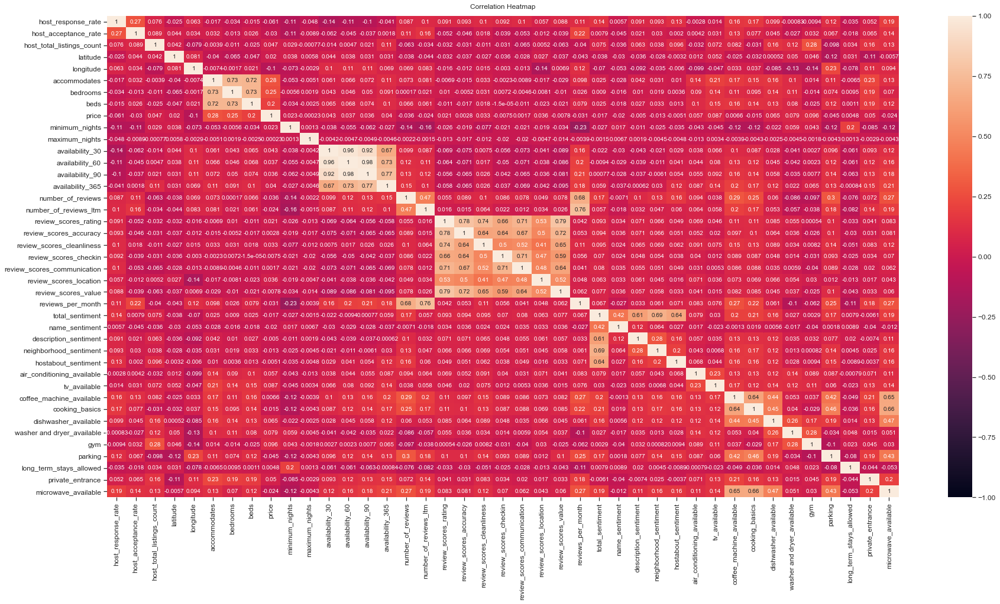

In [375]:
import seaborn as sns
data_corr = df2.corr()
plt.figure(figsize=(30, 15))
heatmap = sns.heatmap(data_corr, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [376]:
corr_matrix = df2.corr()

mat = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
                  .stack()
                  .sort_values(ascending=False))
mat

availability_60       availability_90           0.983451
availability_30       availability_60           0.964108
                      availability_90           0.924654
review_scores_rating  review_scores_value       0.794091
                      review_scores_accuracy    0.783714
                                                  ...   
longitude             gym                      -0.135603
minimum_nights        number_of_reviews        -0.137510
longitude             review_scores_location   -0.143080
minimum_nights        number_of_reviews_ltm    -0.164784
                      reviews_per_month        -0.230553
Length: 820, dtype: float64

Anything above 75% is considered multicollinear. From the above results, we can see that availability_30, availability_60, and availability_90 are highly correlated to each other. Since New York has recently applied a rule that no rental can be less than 30 days, its better to keep availablity_90 and drop the rest. review_scores_ratings, review_scores_accuracy, and review_scores_values are correlated as well so onlt review_score_accuracy will be kept. 

In [451]:
df2 = df2.drop(columns = ['availability_30', 'availability_60','review_scores_rating','review_scores_value'])

In [378]:
corr_matrix=df2.corr()
corr_matrix["price"].sort_values(ascending=False)

price                          1.000000
accommodates                   0.276537
bedrooms                       0.251487
beds                           0.201769
gym                            0.095686
tv_available                   0.086851
washer and dryer_available     0.079427
dishwasher_available           0.064528
air_conditioning_available     0.056686
private_entrance               0.049617
host_total_listings_count      0.047327
availability_365               0.040333
review_scores_location         0.036454
availability_90                0.035982
review_scores_cleanliness      0.033119
minimum_nights                 0.023094
latitude                       0.019951
coffee_machine_available       0.006619
long_term_stays_allowed        0.004798
review_scores_accuracy         0.002778
review_scores_communication    0.001680
maximum_nights                -0.000235
description_sentiment         -0.004959
hostabout_sentiment           -0.005120
review_scores_checkin         -0.007539


None of the newly added variables correlate highly with the price, so this is good!

**Visualization of all predictors**

KeyboardInterrupt: 

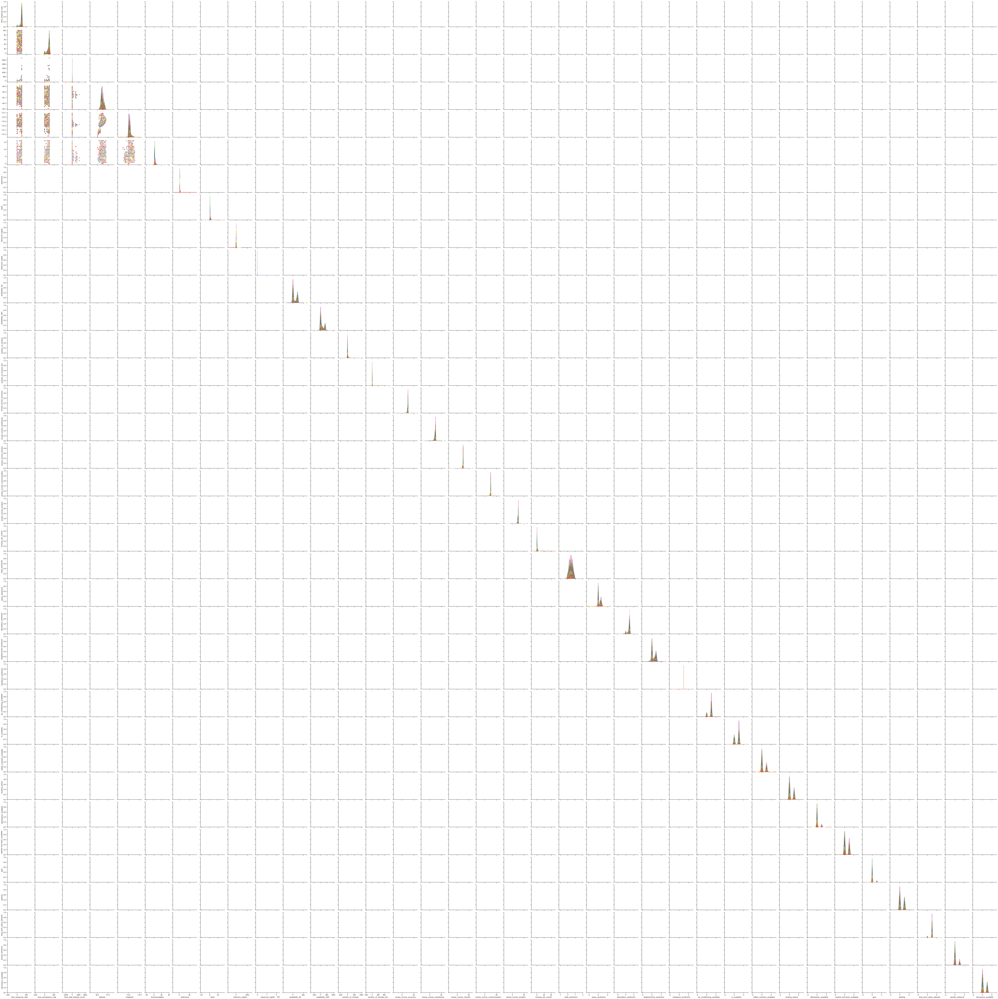

In [379]:
sns.set(style="ticks")

sns.pairplot(df2, hue="price", palette="Set1")
plt.show()

**Visualize distribution of numerical variables**

In [ ]:
num_vars = df2.select_dtypes('int64', 'float64')

num_vars.hist(bins=20, figsize=(20,15), color='midnightblue')
plt.show();

**Visualize distribution of Categorical Variables**

In [ ]:
cat_vars = df2.select_dtypes('object')

fig, axes = plt.subplots(round(len(cat_vars.columns) / 4), 4, figsize=(20, 15))

for i, ax in enumerate(fig.axes):
    if i < len(cat_vars.columns):
        cat_vars[cat_vars.columns[i]].value_counts().plot.pie(autopct = '%1.1f%%',ax = ax, colormap='tab20b')
        #ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        ax.set_title(cat_vars.columns[i])

fig.tight_layout();

# Visualization

In [ ]:
df1['review_scores_rating']

In [ ]:
plt.figure(figsize=(10,7))
plt.scatter(x='review_scores_rating', y="price", data=df1)
plt.title('Price as a function of Review Scores Rating') #title
plt.xlabel('Review Scores Rating') #x label
plt.ylabel('Price') #y la

### Starbucks Effect

Brief Description of starbucks effect: ....

In [57]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt

In [58]:
df_airbnb=pd.read_csv(('http://data.insideairbnb.com/united-states/ny/new-york-city/2021-02-04/data/listings.csv.gz'))

In [434]:
df_airbnb['neighbourhood_group_cleansed'].value_counts()
df1.groupby('neighbourhood_group_cleansed')['price_per_accommodates'].mean()

neighbourhood_group_cleansed
Bronx            33.966254
Brooklyn         43.329440
Manhattan        63.230544
Queens           39.402458
Staten Island    32.186507
Name: price_per_accommodates, dtype: float64

In [435]:
df_places = gpd.read_file('new-york.geojson')
df_places['airbnb_num']=[289,4704,14474,16553,992]
df_places['starbucks_num']=[36,50,50,223,50]
df_places['price_per_acc']=[28.97,32.44,39.97,55.44,31.93]

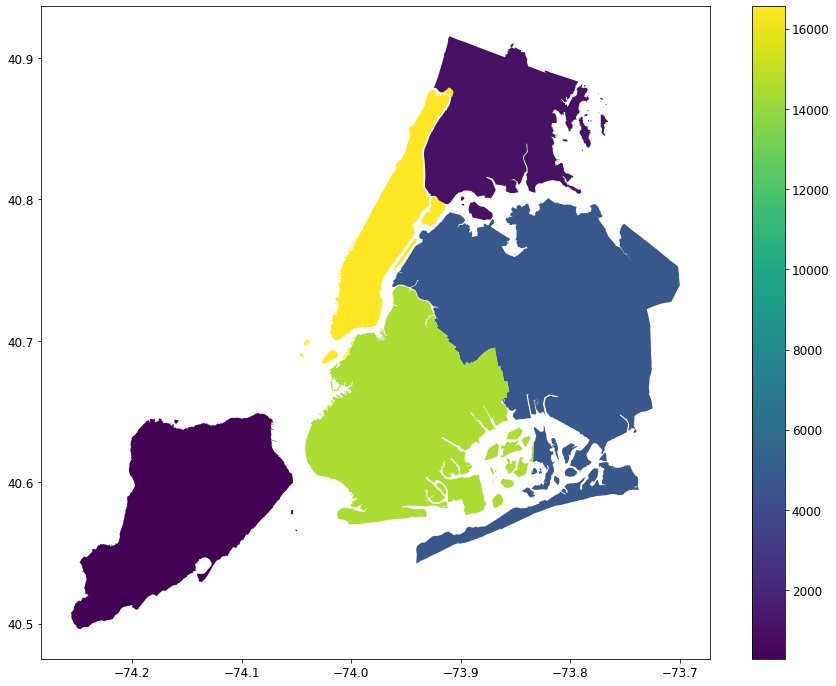

In [436]:
f, ax = plt.subplots(1, figsize=(15, 12))
ax =df_places.plot(column='airbnb_num',ax=ax,legend=True)

plt.show()

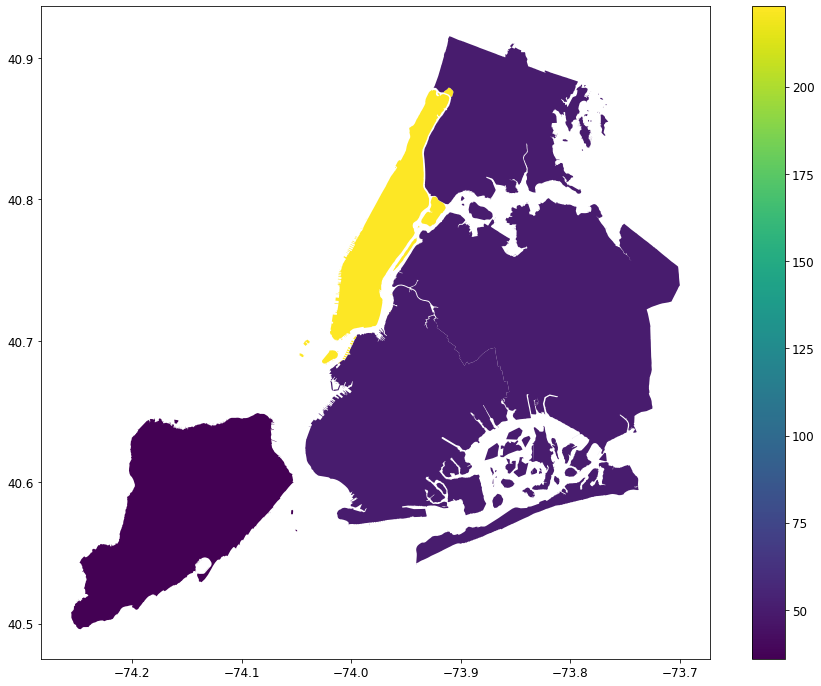

In [437]:
f, ax = plt.subplots(1, figsize=(15, 12))
ax =df_places.plot(column='starbucks_num',ax=ax,legend=True)

plt.show()

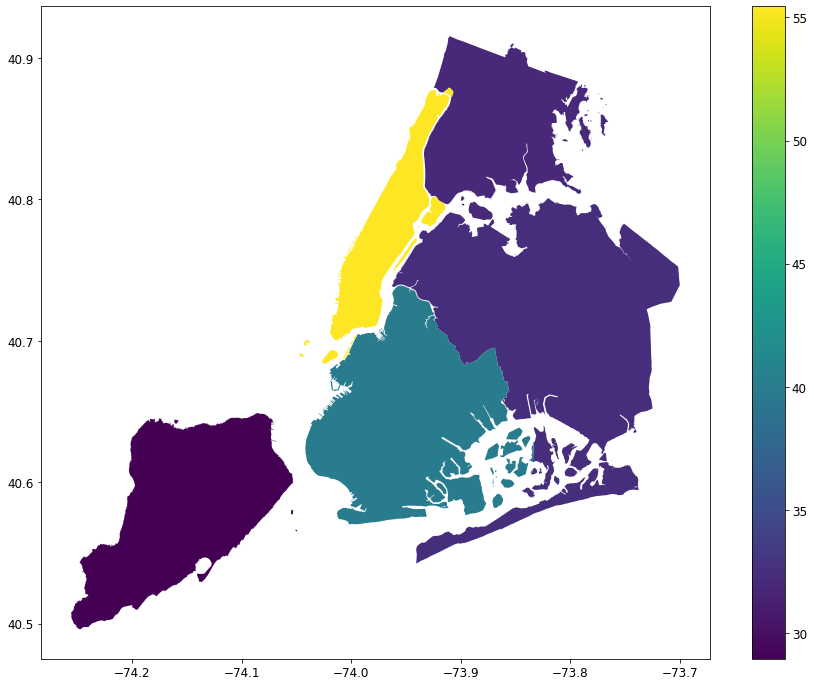

In [438]:
f, ax = plt.subplots(1, figsize=(15, 12))
ax =df_places.plot(column='price_per_acc',ax=ax,legend=True)

plt.show()

- Remove the text attribute because median can only be calculated on numerical attributes:

# 3 - Data Pre-Processing

### Train-Val-Test Split

In [452]:
#Drop variables that are duplicates
df2 = df2.drop(columns = ['host_verifications','neighbourhood_cleansed', 'latitude','longitude', 'bathrooms_text'])

In [453]:
df3 = df2.copy(deep = True)

In [454]:
df3.shape

(37012, 53)

In [445]:
import numpy as np

def split_train_test(data, test_ratio):
    shuffled_indices = np.random.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    return data.iloc[train_indices], data.iloc[test_indices]

In [456]:
train_set,test_set=split_train_test(df3,0.3)
print("The length of train set is: ",len(train_set))
print("The length of test set is: ",len(test_set))

The length of train set is:  25909
The length of test set is:  11103


In [457]:
#valid_set,test_set=split_train_test(valid_set,0.4)
#print("The length of valid set is: ",len(valid_set))
#print("The length of test set is: ",len(test_set))

In [458]:
train_set.shape, test_set.shape

((25909, 53), (11103, 53))

### Missing Values

In [459]:
# Missing values statistics
miss_values = missing_values(train_set)
miss_values

Dataframe has 53 columns.
There are 16 columns that have missing values.


,Missing Values,% of Total Values
host_response_time,12973,50.1
host_response_rate,12973,50.1
host_acceptance_rate,10265,39.6
review_scores_location,7170,27.7
review_scores_checkin,7169,27.7
review_scores_accuracy,7160,27.6
review_scores_communication,7156,27.6
review_scores_cleanliness,7152,27.6
reviews_per_month,6650,25.7
first_review_days,6650,25.7


In [460]:
# Missing values statistics
miss_values_test = missing_values(test_set)
miss_values_test

Dataframe has 53 columns.
There are 16 columns that have missing values.


,Missing Values,% of Total Values
host_response_time,5534,49.8
host_response_rate,5534,49.8
host_acceptance_rate,4368,39.3
review_scores_checkin,3102,27.9
review_scores_location,3102,27.9
review_scores_communication,3101,27.9
review_scores_accuracy,3099,27.9
review_scores_cleanliness,3096,27.9
reviews_per_month,2873,25.9
first_review_days,2873,25.9


**FLAGGING MISSING VALUES**

In [461]:
cols = miss_values.index
df_try = train_set[cols].isnull().astype(int).add_suffix('_indicator')
#df_try

#merge both the df1 and the flagged columns
train_set = pd.merge(train_set, df_try, left_index=True, right_index=True)
train_set.head(10)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,room_type,accommodates,...,review_scores_communication_indicator,review_scores_cleanliness_indicator,reviews_per_month_indicator,first_review_days_indicator,last_review_days_indicator,bedrooms_indicator,beds_indicator,host_total_listings_count_indicator,host_since_days_indicator,price_per_accommodates_indicator
7353,NaN,NaN,NaN,0,1.0,1,1,Brooklyn,Entire home/apt,2,...,1,1,1,1,1,0,0,0,0,0
19130,NaN,NaN,NaN,0,1.0,1,0,Queens,Entire home/apt,5,...,1,1,1,1,1,1,0,0,0,0
10810,NaN,NaN,NaN,0,1.0,1,1,Manhattan,Entire home/apt,2,...,1,1,1,1,1,0,0,0,0,0
8005,NaN,NaN,86.0,0,1.0,1,0,Manhattan,Entire home/apt,7,...,0,0,0,0,0,0,0,0,0,0
34454,within an hour,93.0,94.0,0,0.0,1,1,Brooklyn,Private room,2,...,1,1,1,1,1,0,0,0,0,0
15680,NaN,NaN,NaN,0,1.0,1,0,Manhattan,Private room,2,...,0,0,0,0,0,0,0,0,0,0
35592,within an hour,99.0,100.0,1,0.0,1,1,Manhattan,Private room,2,...,0,0,0,0,0,0,0,0,0,0
123,within an hour,100.0,100.0,0,3.0,1,1,Brooklyn,Private room,2,...,0,0,0,0,0,0,0,0,0,0
7314,NaN,NaN,NaN,0,1.0,1,1,Manhattan,Entire home/apt,2,...,0,0,0,0,0,1,0,0,0,0
15329,NaN,NaN,NaN,0,1.0,1,1,Manhattan,Private room,2,...,1,1,1,1,1,0,0,0,0,0


In [462]:
cols1 = miss_values_test.index
df_try1 = test_set[cols1].isnull().astype(int).add_suffix('_indicator')
#df_try

#merge both the df1 and the flagged columns
test_set = pd.merge(test_set, df_try1, left_index=True, right_index=True)
test_set.head(10)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,room_type,accommodates,...,review_scores_accuracy_indicator,review_scores_cleanliness_indicator,reviews_per_month_indicator,first_review_days_indicator,last_review_days_indicator,bedrooms_indicator,beds_indicator,host_total_listings_count_indicator,host_since_days_indicator,price_per_accommodates_indicator
28940,within an hour,100.0,94.0,0,1318.0,1,1,Manhattan,Entire home/apt,4,...,1,1,1,1,1,0,0,0,0,0
31839,within an hour,100.0,99.0,0,1337.0,1,1,Manhattan,Entire home/apt,4,...,1,1,1,1,1,0,0,0,0,0
3696,within a few hours,100.0,100.0,1,3.0,1,1,Queens,Private room,1,...,0,0,0,0,0,0,0,0,0,0
36044,within an hour,85.0,100.0,0,13.0,1,1,Manhattan,Entire home/apt,4,...,1,1,1,1,1,0,0,0,0,0
3408,NaN,NaN,NaN,0,1.0,1,1,Manhattan,Entire home/apt,1,...,0,0,0,0,0,1,0,0,0,0
3965,NaN,NaN,NaN,0,1.0,1,1,Brooklyn,Private room,2,...,0,0,0,0,0,0,0,0,0,0
22507,a few days or more,0.0,0.0,0,1.0,1,1,Brooklyn,Entire home/apt,2,...,0,0,0,0,0,0,0,0,0,0
54,NaN,NaN,NaN,0,1.0,1,1,Brooklyn,Entire home/apt,2,...,0,0,0,0,0,0,0,0,0,0
32401,within a few hours,93.0,92.0,0,5.0,1,1,Brooklyn,Entire home/apt,10,...,0,0,0,0,0,0,0,0,0,0
29712,within an hour,100.0,88.0,1,3.0,1,1,Bronx,Private room,2,...,0,0,0,0,0,0,0,0,0,0


**ITERATIVE IMPUTER** For numerical variables

In [463]:
train_set.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_group_cleansed', 'room_type', 'accommodates', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'reviews_per_month',
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'host_since_days',
       'first_review_days', 'last_review_days', 'price_per_accommodates',
       'num_bath', 'name_bath', 'total_sentiment', 'name_sentiment',
       'description_sentiment', 'neighborhood_sentiment',
       'hostabout_sentiment', 'air_condition

In [464]:
#choose numerical variables only
df_num = train_set.drop(columns=['host_response_time', 'neighbourhood_group_cleansed','name_bath', 'room_type'])
#df_num=df3[['host_response_rate', 'host_acceptance_rate','review_scores_value', 'review_scores_location',
#                     'review_scores_checkin','review_scores_accuracy','review_scores_communication',
#                     'review_scores_cleanliness','review_scores_rating','reviews_per_month','first_review_days',
#                     'last_review_days','bedrooms','beds','host_total_listings_count','host_since_days']]

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imp = IterativeImputer(random_state=0)

df_num1 = imp.fit_transform(df_num)

cols = list(df_num)

df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols

# Re-check Missing values statistics
miss_values = missing_values(df_num1)
miss_values.head(20)

Dataframe has 65 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


**Now, replace the incomplete columns in train_set with the corresponding imputed columns from df_num1**

In [465]:
train_set[cols] = df_num1[cols].values

train_set.head(5)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,room_type,accommodates,...,review_scores_communication_indicator,review_scores_cleanliness_indicator,reviews_per_month_indicator,first_review_days_indicator,last_review_days_indicator,bedrooms_indicator,beds_indicator,host_total_listings_count_indicator,host_since_days_indicator,price_per_accommodates_indicator
7353,NaN,66.841539,38.002692,0.0,1.0,1.0,1.0,Brooklyn,Entire home/apt,2.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
19130,NaN,57.593276,46.835675,0.0,1.0,1.0,0.0,Queens,Entire home/apt,5.0,...,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
10810,NaN,61.941173,39.190492,0.0,1.0,1.0,1.0,Manhattan,Entire home/apt,2.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
8005,NaN,80.081922,86.000000,0.0,1.0,1.0,0.0,Manhattan,Entire home/apt,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34454,within an hour,93.000000,94.000000,0.0,0.0,1.0,1.0,Brooklyn,Private room,2.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


In [466]:
# Re-check Missing values statistics
miss_values = missing_values(train_set)
miss_values.head(20)

Dataframe has 69 columns.
There are 1 columns that have missing values.


,Missing Values,% of Total Values
host_response_time,12973,50.1


**We have taken care of the numerical values, and need to work on the categorical values next...**

In [467]:
train_set['host_response_time'].mode()

0    within an hour
dtype: object

In [468]:
train_set['host_response_time'] = train_set['host_response_time'].fillna("within an hour")

In [469]:
# Check Missing values statistics again
miss_values = missing_values(train_set)
miss_values.head(20)

Dataframe has 69 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


### Categorical Encoding

In [470]:
train_set = pd.get_dummies(train_set, columns=['host_response_time','neighbourhood_group_cleansed','name_bath', 'room_type'])

In [471]:
train_set.head(5)

,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,price,...,neighbourhood_group_cleansed_Staten Island,name_bath_,name_bath_half-bath,name_bath_nan,name_bath_private bath,name_bath_shared bath,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
7353,66.841539,38.002692,0.0,1.0,1.0,1.0,2.0,1.000000,0.0,80.0,...,0,0,0,0,1,0,1,0,0,0
19130,57.593276,46.835675,0.0,1.0,1.0,0.0,5.0,2.780818,5.0,160.0,...,0,0,0,0,1,0,1,0,0,0
10810,61.941173,39.190492,0.0,1.0,1.0,1.0,2.0,1.000000,1.0,180.0,...,0,0,0,0,1,0,1,0,0,0
8005,80.081922,86.000000,0.0,1.0,1.0,0.0,7.0,1.000000,0.0,179.0,...,0,0,0,0,1,0,1,0,0,0
34454,93.000000,94.000000,0.0,0.0,1.0,1.0,2.0,1.000000,1.0,33.0,...,0,0,0,0,0,1,0,0,1,0


**Same Functions on test dataset**

In [472]:
#choose numerical variables only
df_num3= test_set.drop(columns=['host_response_time', 'neighbourhood_group_cleansed','name_bath', 'room_type'])
#df_num=df3[['host_response_rate', 'host_acceptance_rate','review_scores_value', 'review_scores_location',
#                     'review_scores_checkin','review_scores_accuracy','review_scores_communication',
#                     'review_scores_cleanliness','review_scores_rating','reviews_per_month','first_review_days',
#                     'last_review_days','bedrooms','beds','host_total_listings_count','host_since_days']]

imp1 = IterativeImputer(random_state=0)

df_num4 = imp.fit_transform(df_num3)

cols = list(df_num3)

df_num4=pd.DataFrame(df_num4)
df_num4.columns=cols

# Re-check Missing values statistics
miss_values4 = missing_values(df_num4)
miss_values4.head(20)

Dataframe has 65 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


**Now, replace the incomplete columns in test_set with the corresponding imputed columns from df_num4**

In [473]:
test_set[cols] = df_num4[cols].values

test_set.head(5)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,room_type,accommodates,...,review_scores_accuracy_indicator,review_scores_cleanliness_indicator,reviews_per_month_indicator,first_review_days_indicator,last_review_days_indicator,bedrooms_indicator,beds_indicator,host_total_listings_count_indicator,host_since_days_indicator,price_per_accommodates_indicator
28940,within an hour,100.000000,94.000000,0.0,1318.0,1.0,1.0,Manhattan,Entire home/apt,4.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
31839,within an hour,100.000000,99.000000,0.0,1337.0,1.0,1.0,Manhattan,Entire home/apt,4.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3696,within a few hours,100.000000,100.000000,1.0,3.0,1.0,1.0,Queens,Private room,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36044,within an hour,85.000000,100.000000,0.0,13.0,1.0,1.0,Manhattan,Entire home/apt,4.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3408,NaN,46.168415,22.552437,0.0,1.0,1.0,1.0,Manhattan,Entire home/apt,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [474]:
# Re-check Missing values statistics
miss_values5 = missing_values(test_set)
miss_values5.head(20)

Dataframe has 69 columns.
There are 1 columns that have missing values.


,Missing Values,% of Total Values
host_response_time,5534,49.8


**We have taken care of the numerical values, and need to work on the categorical values next...**

In [475]:
test_set['host_response_time'].mode()

0    within an hour
dtype: object

In [476]:
test_set['host_response_time'] = test_set['host_response_time'].fillna("within an hour")

In [477]:
# Check Missing values statistics again
miss_values6 = missing_values(test_set)
miss_values6.head(20)

Dataframe has 69 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


### Categorical Encoding

In [478]:
test_set = pd.get_dummies(test_set, columns=['host_response_time','neighbourhood_group_cleansed','name_bath', 'room_type'])

**Correlations**

In [479]:
corr_matrix = train_set.corr()

mat = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
                  .stack()
                  .sort_values(ascending=False))
mat

reviews_per_month_indicator            last_review_days_indicator                1.000000
host_total_listings_count_indicator    host_since_days_indicator                 1.000000
reviews_per_month_indicator            first_review_days_indicator               1.000000
host_response_time_indicator           host_response_rate_indicator              1.000000
first_review_days_indicator            last_review_days_indicator                1.000000
                                                                                   ...   
neighbourhood_group_cleansed_Brooklyn  neighbourhood_group_cleansed_Manhattan   -0.724111
room_type_Entire home/apt              room_type_Private room                   -0.945462
name_bath_private bath                 name_bath_shared bath                    -0.988475
host_response_rate                     host_acceptance_rate                     -0.998441
                                       maximum_nights                           -0.999999
Length: 34

<Figure size 2160x1080 with 0 Axes>

Text(0.5, 1.0, 'Correlation Heatmap')

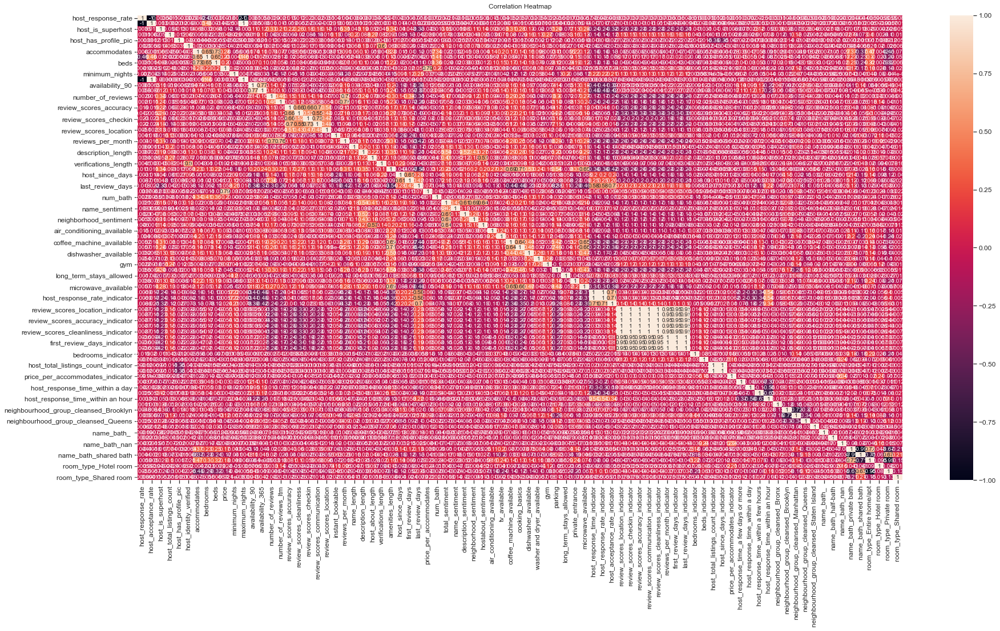

In [480]:
data_corr2 = train_set.corr()
plt.figure(figsize=(30, 15))
heatmap1 = sns.heatmap(data_corr2, vmin=-1, vmax=1, annot=True)
heatmap1.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

Dropping highy correlated variables 

In [481]:
train_set = train_set.drop(columns = ['host_response_rate_indicator','host_since_days_indicator','reviews_per_month_indicator','first_review_days_indicator','reviews_per_month_indicator','review_scores_cleanliness_indicator','review_scores_accuracy_indicator','review_scores_checkin_indicator','review_scores_communication_indicator','review_scores_accuracy_indicator','room_type_Private room','maximum_nights','name_bath_shared bath', 'host_acceptance_rate'])

In [482]:
test_set = test_set.drop(columns = ['host_response_rate_indicator','host_since_days_indicator','reviews_per_month_indicator','first_review_days_indicator','reviews_per_month_indicator','review_scores_cleanliness_indicator','review_scores_accuracy_indicator','review_scores_checkin_indicator','review_scores_communication_indicator','review_scores_accuracy_indicator','room_type_Private room','maximum_nights','name_bath_shared bath', 'host_acceptance_rate'])

### Outlier Treatment

In [483]:
from sklearn.ensemble import IsolationForest

iforest = IsolationForest(n_estimators=100, random_state=42, contamination=0.02)
pred = iforest.fit_predict(train_set)
score = iforest.decision_function(train_set)

from numpy import where
anom_index = where(pred== -1)
values = train_set.iloc[anom_index]
values

,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,price,minimum_nights,...,neighbourhood_group_cleansed_Manhattan,neighbourhood_group_cleansed_Queens,neighbourhood_group_cleansed_Staten Island,name_bath_,name_bath_half-bath,name_bath_nan,name_bath_private bath,room_type_Entire home/apt,room_type_Hotel room,room_type_Shared room
19130,57.593276,0.0,1.0,1.0,0.0,5.0,2.780818,5.000000,160.0,30.0,...,0,1,0,0,0,0,1,1,0,0
26438,100.000000,0.0,2.0,1.0,1.0,6.0,2.000000,4.000000,99.0,30.0,...,1,0,0,0,0,0,1,1,0,0
29779,88.631610,0.0,2.0,1.0,1.0,4.0,1.603034,1.941859,0.0,30.0,...,1,0,0,0,0,1,0,0,1,0
30330,94.000000,0.0,26.0,1.0,1.0,2.0,1.000000,2.000000,36.0,30.0,...,0,0,0,0,0,0,0,0,0,0
34422,100.000000,0.0,1337.0,1.0,1.0,2.0,1.000000,1.000000,271.0,30.0,...,1,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21195,0.000000,0.0,11.0,1.0,1.0,4.0,1.000000,2.000000,913.0,30.0,...,1,0,0,0,0,0,1,0,1,0
31362,33.000000,0.0,1.0,1.0,1.0,2.0,1.000000,4.000000,37.0,7.0,...,0,0,0,0,0,0,0,0,0,0
31012,0.000000,0.0,0.0,1.0,0.0,1.0,1.000000,1.000000,40.0,30.0,...,0,0,0,0,0,0,0,0,0,0
30940,0.000000,0.0,1.0,1.0,1.0,4.0,2.000000,2.000000,220.0,240.0,...,1,0,0,0,0,0,1,1,0,0


**NOTE: Out of 22208 observations, there are 445 outliers. We will remove the outliers.**

In [484]:
train_set = train_set[~train_set.index.isin(values.index)]
train_set.shape

(25390, 71)

In [485]:
train_set.columns

Index(['host_response_rate', 'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'accommodates',
       'bedrooms', 'beds', 'price', 'minimum_nights', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'reviews_per_month',
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'host_since_days',
       'first_review_days', 'last_review_days', 'price_per_accommodates',
       'num_bath', 'total_sentiment', 'name_sentiment',
       'description_sentiment', 'neighborhood_sentiment',
       'hostabout_sentiment', 'air_conditioning_available', 'tv_available',
       'coffee_machine_available', 'cooking_basics', 'dishwasher_available',
       'washer and dryer_av

**Separate Predictors and Target Variable**

In [541]:
y_train = train_set['price']
X_train = train_set.drop(columns=['price',  'price_per_accommodates_indicator','price_per_accommodates']) ##taking anything related to price to avoid data leakage

In [542]:
y_test = test_set['price']
X_test = test_set.drop(columns=['price',  'price_per_accommodates_indicator','price_per_accommodates']) ##taking anything related to price to avoid data leakage

### Standardize Data

In [543]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_std = sc.fit_transform(X_train)
X_test_sd = sc.transform(X_test)

In [544]:
X_test_sd = pd.DataFrame(X_test_sd,columns = X_test.columns)
X_train_std = pd.DataFrame(X_train_std,columns = X_train.columns)


### Feature Selection

In [489]:
from sklearn.ensemble import RandomForestClassifier
randomforest = RandomForestClassifier(random_state=0)

model = randomforest.fit(X_train,y_train)

model.feature_importances_

pd.DataFrame(list(zip(X_train.columns,model.feature_importances_)), columns = ['predictor','feature importance']).sort_values("feature importance")

MemoryError: could not allocate 160694272 bytes

In [334]:
model_features = pd.DataFrame(list(zip(X_train.columns,model.feature_importances_)), columns = ['predictor','feature importance']).sort_values("feature importance")
model_features.tail(20)

,predictor,feature importance
17,review_scores_location,0.021677
2,host_total_listings_count,0.022342
10,availability_365,0.024762
14,review_scores_cleanliness,0.024928
33,hostabout_sentiment,0.025070
30,name_sentiment,0.027700
22,host_about_length,0.028584
23,verifications_length,0.028907
11,number_of_reviews,0.030037
32,neighborhood_sentiment,0.030879


In [490]:
#Recursive Feature Elimination Method
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0)
rfe = RFE(rf, n_features_to_select=50)
model_l = rfe.fit(X_train_std, y_train)


In [545]:
model_l_df = pd.DataFrame(list(zip(X_train.columns,model_l.ranking_)), columns = ['predictor','ranking'])
model_l_df

,predictor,ranking
0,host_response_rate,1
1,host_is_superhost,9
2,host_total_listings_count,1
3,host_has_profile_pic,13
4,host_identity_verified,1
...,...,...
63,name_bath_nan,15
64,name_bath_private bath,1
65,room_type_Entire home/apt,1
66,room_type_Hotel room,7


In [546]:
notgood = model_l_df[model_l_df['ranking'] !=1 ]
notgood

,predictor,ranking
1,host_is_superhost,9
3,host_has_profile_pic,13
34,air_conditioning_available,3
37,cooking_basics,11
38,dishwasher_available,4
47,review_scores_location_indicator,5
51,host_total_listings_count_indicator,19
53,host_response_time_within a day,2
54,host_response_time_within a few hours,6
56,neighbourhood_group_cleansed_Bronx,14


In [547]:
to_drop = notgood['predictor'].to_list()


In [548]:

#Removing the features that are useless to our model

for i in to_drop:
     X_train_std= X_train_std.drop(columns = [i])

In [549]:
for i in to_drop:
     X_test_sd= X_test_sd.drop(columns = [i])

### Pre-Process Validation Set

In [74]:
#Flag Missing Values
miss_values = missing_values(valid_set)
cols = miss_values.index
df_try = valid_set[cols].isnull().astype(int).add_suffix('_indicator')

#merge both the df1 and the flagged columns
valid_set = pd.merge(valid_set, df_try, left_index=True, right_index=True)

#Iterative Imputer
df_num = valid_set.drop(columns=['host_response_time', 'neighbourhood_group_cleansed','name_bath', 'room_type'])
imp = IterativeImputer(random_state=0)
df_num1 = imp.fit_transform(df_num)
cols = list(df_num)
df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols
valid_set[cols] = df_num1[cols].values

#categorical encoding
valid_set['host_response_time'] = valid_set['host_response_time'].fillna("within an hour")
valid_set = pd.get_dummies(valid_set, columns=['host_response_time','neighbourhood_group_cleansed','name_bath', 'room_type'])

#drop correlated variables
#val = val.drop(['Complain_0','Gender_Male','CityTier_3', 'PreferredLoginDevice_Computer'], axis=1)

#Separate Features and Target
y_valid = valid_set['price']
X_valid = valid_set.drop(columns=['price'])

#drop most useless variables from feature selection
#X_val = X_val.drop(['PreferedOrderCat_Others','PreferedOrderCat_Grocery','CityTier_2','MaritalStatus_Divorced','PreferredPaymentMode_UPI','PreferedOrderCat_Fashion'], axis=1)

#standardize the data
sc = StandardScaler()
X_valid_std = sc.fit_transform(X_valid)

Dataframe has 57 columns.
There are 18 columns that have missing values.


In [75]:
X_valid_std.shape, y_valid.shape, X_train.shape, y_train.shape

((8883, 88), (8883,), (21763, 88), (21763,))

# 4 - Machine Learning

## A) Unsupervised Learning

### PCA

StandardScaler()

PCA(n_components=2)

<Figure size 576x432 with 0 Axes>

Text(0.5, 0, 'First principal component')

Text(0, 0.5, 'Second Principal Component')

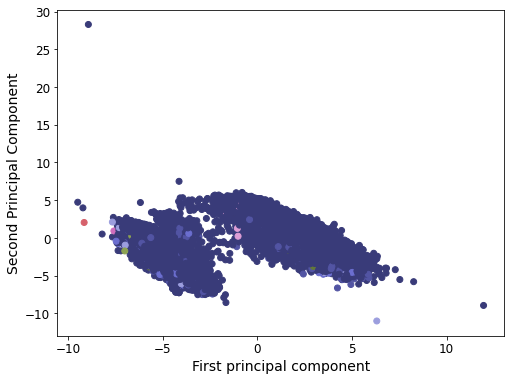

In [76]:
from sklearn.decomposition import PCA
scaler = StandardScaler()
scaler.fit(train_set)
scaled_data = scaler.transform(train_set)
pca = PCA(n_components=2)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=train_set['price'],cmap='tab20b')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

<Figure size 864x432 with 0 Axes>

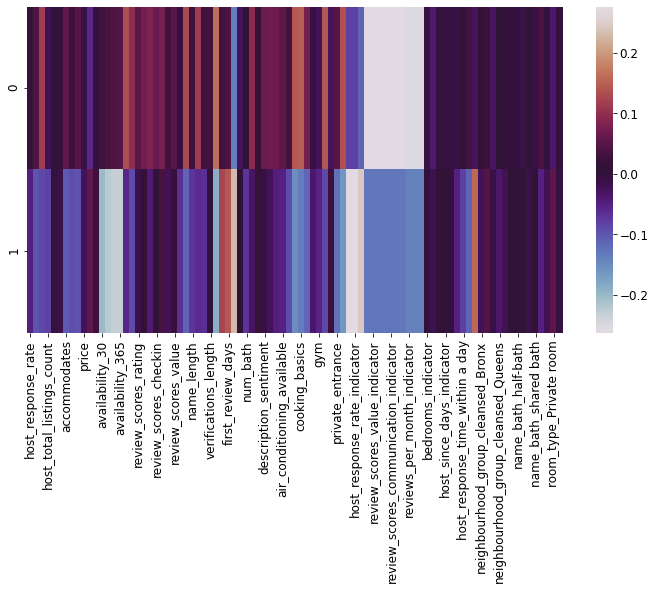

In [77]:
map= pd.DataFrame(pca.components_,columns=train_set.columns)
plt.figure(figsize=(12,6))
sns.heatmap(map,cmap='twilight')

## B) Semi-Supervised Learning

Add Fandi's code here

## Semi-Supervised Model

In [792]:
import numpy as np
from sklearn import datasets
from sklearn.metrics import confusion_matrix
from sklearn.semi_supervised import LabelSpreading

### To mask data to labeled and unlabeled

In [793]:
import numpy as np
import random

In [105]:
from sklearn.metrics import mean_squared_error
from numpy import concatenate
def runLP(x,target,x_test,target_test,n):
        

    data = x
    labels = target

    X_train_lab, X_test_unlab, y_train_lab, y_test_unlab = train_test_split(data, labels, test_size=n, random_state=123)
    #RUN THE MODEL
    X_train_mixed = concatenate((X_train_lab, X_test_unlab))
    # create "no label" for unlabeled data
    nolabel = [-1 for _ in range(len(y_test_unlab))]
    # recombine training dataset labels
    y_train_mixed = concatenate((y_train_lab, nolabel))
    print(y_train_mixed)
    model = LabelSpreading(max_iter=100)
    model.fit(X_train_mixed, y_train_mixed)
    pred = np.array(model.predict(x_test))
    #SEPARATE PREDICTED SAMPLES
    print(model.predict(x).sum())

    
    #PRINT CONFUSION MATRIX
    return model, mean_squared_error(target_test, pred),target_test,pred

In [106]:
train_set.columns

Index(['last_scraped', 'name', 'description', 'host_name', 'host_since',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost',
       'host_total_listings_count', 'host_verifications',
       'host_identity_verified', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bathrooms_text',
       'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights',
       'maximum_nights', 'number_of_reviews', 'number_of_reviews_l30d',
       'first_review', 'last_review', 'review_scores_rating',
       'instant_bookable', 'reviews_per_month', 'last_scarped', 'name_length',
       'description_length', 'host_about_length', 'verifications_length',
       'amenities_length', 'host_since_days', 'first_reviews_days',
       'last_review_days', 'price_per_accommodates', 'num_bath', 'name_bath',
       'air_conditioning_available', 'bbq_available', 'pat

In [107]:
train_set.describe().columns

Index(['host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_total_listings_count', 'host_identity_verified', 'latitude',
       'longitude', 'accommodates', 'bedrooms', 'beds', 'price',
       'minimum_nights', 'maximum_nights', 'number_of_reviews',
       'number_of_reviews_l30d', 'review_scores_rating', 'instant_bookable',
       'reviews_per_month', 'name_length', 'description_length',
       'host_about_length', 'verifications_length', 'amenities_length',
       'host_since_days', 'first_reviews_days', 'last_review_days',
       'price_per_accommodates', 'air_conditioning_available', 'bbq_available',
       'patio', 'beach', 'breakfast_available', 'tv_available',
       'coffee_machine_available', 'cooking_basics', 'dishwasher_available',
       'washer and dryer_available', 'gym', 'parking',
       'long_term_stays_allowed', 'private_entrance', 'microwave_available',
       'Bedford-Stuyvesant', 'Williamsburg', 'Harlem', 'Bushwick',
       'Upper West Si

In [108]:
target=train_set['price']
x=train_set[train_set.describe().columns].drop(['price'],axis=1)
x=x.to_numpy()
target_test=test_set['price']
x_test=test_set[test_set.describe().columns].drop(['price'],axis=1)
x_test=x_test.to_numpy()

In [109]:
target_test.to_numpy()

array([102., 100., 161., ...,  60.,  75.,  86.])

In [110]:
model, matrix,labels,pred=runLP(x,target,x_test,target_test,0.5)

[215. 113. 176. ...  -1.  -1.  -1.]
524536.0


In [111]:
pd.DataFrame(model.predict(x)).describe()

,0
count,7128.000000
mean,73.588103
std,148.862375
min,10.000000
25%,10.000000
50%,10.000000
75%,97.000000
max,4500.000000


In [112]:
pd.DataFrame(labels).describe()

,price
count,1783.000000
mean,132.240606
std,181.644294
min,18.000000
25%,59.500000
50%,95.000000
75%,150.000000
max,4000.000000


In [113]:
pd.DataFrame(pred).describe()

,0
count,1783.000000
mean,10.355020
std,14.990911
min,10.000000
25%,10.000000
50%,10.000000
75%,10.000000
max,643.000000


In [317]:
train_set.columns

Index(['host_response_rate', 'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'accommodates',
       'bedrooms', 'beds', 'price', 'minimum_nights', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'reviews_per_month',
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'host_since_days',
       'first_review_days', 'last_review_days', 'price_per_accommodates',
       'num_bath', 'total_sentiment', 'name_sentiment',
       'description_sentiment', 'neighborhood_sentiment',
       'hostabout_sentiment', 'air_conditioning_available', 'tv_available',
       'coffee_machine_available', 'cooking_basics', 'dishwasher_available',
       'washer and dryer_av

** Testing Ameities: **

Text(0.5, 1.0, 'Distribution of Customer Lifetime Value based on Coverage')

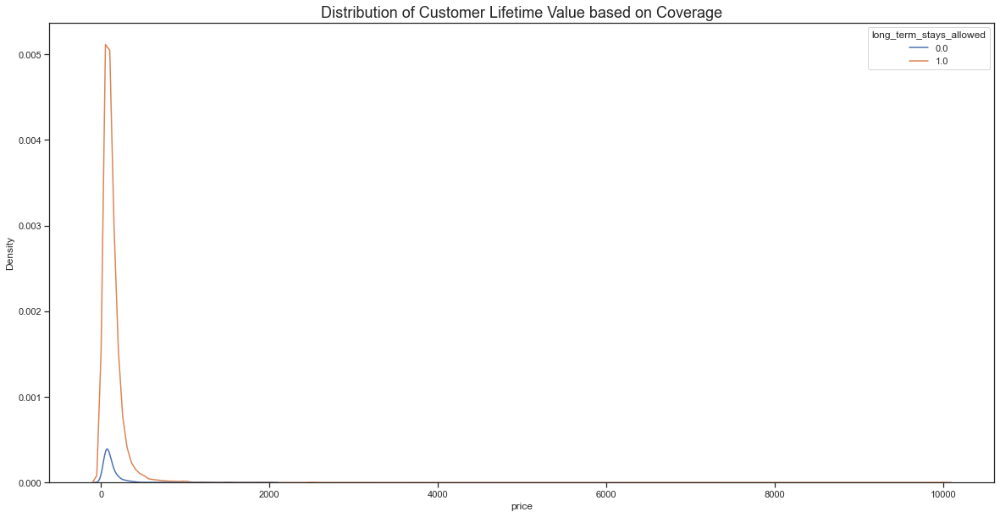

In [320]:
fig = plt.figure(figsize=(20,10)) 
graphs=sns.kdeplot(x = 'price', data=train_set, hue = 'long_term_stays_allowed')


Text(0.5, 1.0, 'Distribution of Customer Lifetime Value based on Coverage')

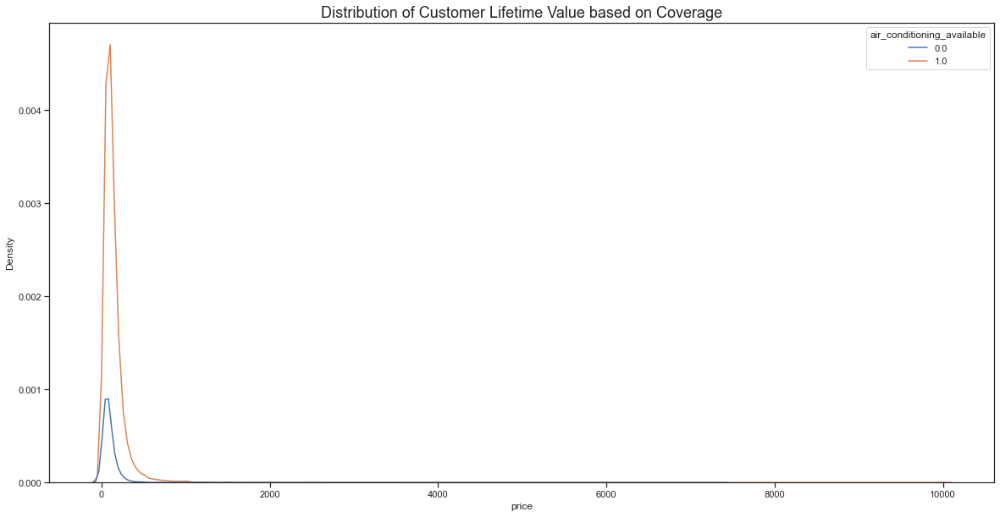

In [321]:
fig = plt.figure(figsize=(20,10)) 
graphs=sns.kdeplot(x = 'price', data=train_set, hue = 'air_conditioning_available')

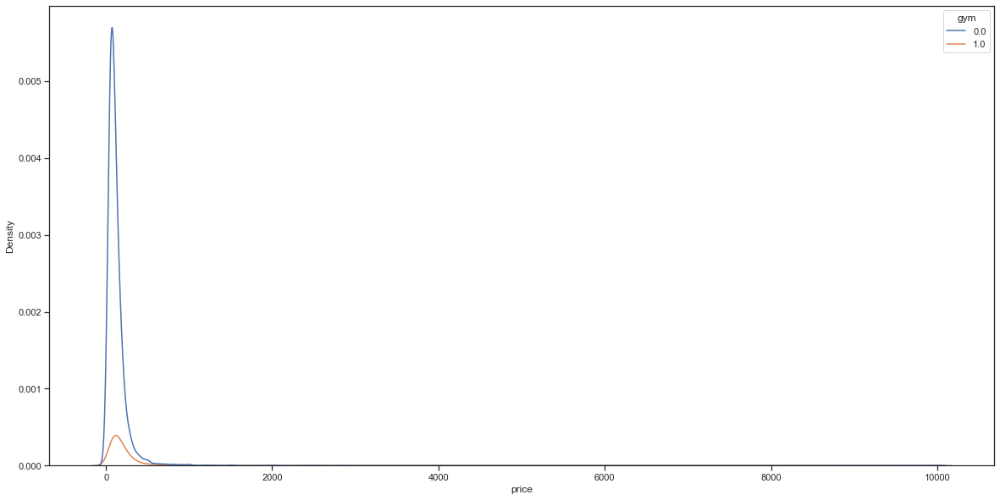

In [327]:
fig = plt.figure(figsize=(20,10)) 
graphs=sns.kdeplot(x = 'price', data=train_set, hue = 'gym', gridsize = 2000)

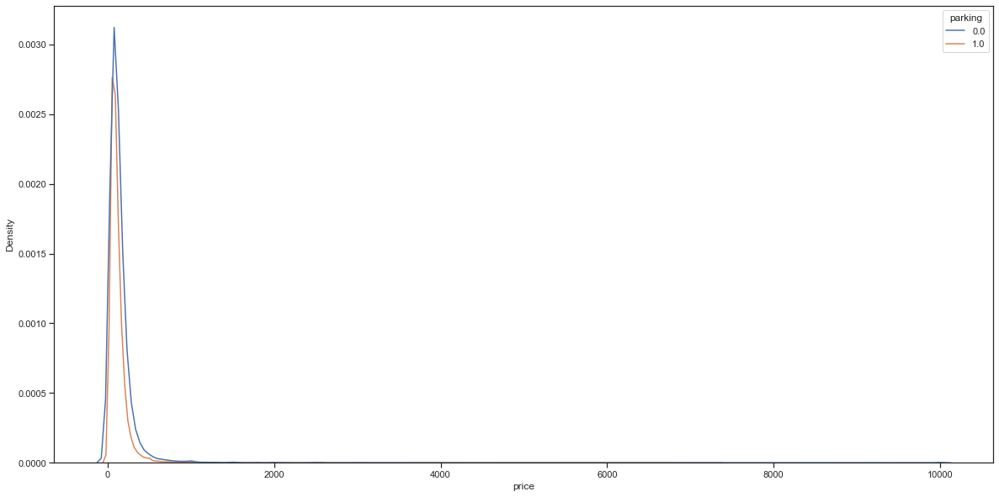

In [323]:
fig = plt.figure(figsize=(20,10)) 
graphs=sns.kdeplot(x = 'price', data=train_set, hue = 'parking')

## C) Supervised Learning

Add AutoML here or in another file

In [49]:
!pip install h2o

  Created wheel for h2o: filename=h2o-3.32.1.1-py2.py3-none-any.whl size=164840234 sha256=f2cc5bc8a12dc09c5f2a6ec4b7da68f93cec704d55a35f853c8e75f9e6e43a61
  Stored in directory: c:\users\shiva\appdata\local\pip\cache\wheels\85\cb\f5\a72d41b4676331c29bbc5bb881bc2ac2fea8a10a4960f3488d
Successfully built h2o


In [50]:
import h2o
from h2o.automl import H2OAutoML
# initialize the h2o session
h2o.init()
# load an h2o DataFrame from pandas DataFrame.

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.281-b09, mixed mode)
  Starting server from C:\Users\shiva\anaconda3\lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\shiva\AppData\Local\Temp\tmpqshlhexh
  JVM stdout: C:\Users\shiva\AppData\Local\Temp\tmpqshlhexh\h2o_shiva_started_from_python.out
  JVM stderr: C:\Users\shiva\AppData\Local\Temp\tmpqshlhexh\h2o_shiva_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,America/Denver
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.1.1
H2O_cluster_version_age:,17 days
H2O_cluster_name:,H2O_from_python_shiva_i7o4ew
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.499 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"accepting new members, healthy"


In [276]:
train_set.to_csv('automl_train.csv')

In [277]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25390 entries, 31556 to 36345
Data columns (total 71 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   host_response_rate                          25390 non-null  float64
 1   host_is_superhost                           25390 non-null  float64
 2   host_total_listings_count                   25390 non-null  float64
 3   host_has_profile_pic                        25390 non-null  float64
 4   host_identity_verified                      25390 non-null  float64
 5   accommodates                                25390 non-null  float64
 6   bedrooms                                    25390 non-null  float64
 7   beds                                        25390 non-null  float64
 8   price                                       25390 non-null  float64
 9   minimum_nights                              25390 non-null  float64
 10  availa

In [278]:
train_set.describe().columns

Index(['host_response_rate', 'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'accommodates',
       'bedrooms', 'beds', 'price', 'minimum_nights', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'reviews_per_month',
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'host_since_days',
       'first_review_days', 'last_review_days', 'price_per_accommodates',
       'num_bath', 'total_sentiment', 'name_sentiment',
       'description_sentiment', 'neighborhood_sentiment',
       'hostabout_sentiment', 'air_conditioning_available', 'tv_available',
       'coffee_machine_available', 'cooking_basics', 'dishwasher_available',
       'washer and dryer_av

In [279]:
df_test = h2o.import_file('automl_train.csv')

x = list(train_set.describe().columns)
x.remove('price')
x.remove('price_per_accommodates')
x.remove('price_per_accommodates_indicator')# remove the target
aml = H2OAutoML(max_models=10, seed=1)

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [280]:
df_test

C1,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,price,minimum_nights,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,instant_bookable,reviews_per_month,name_length,description_length,host_about_length,verifications_length,amenities_length,host_since_days,first_review_days,last_review_days,price_per_accommodates,num_bath,total_sentiment,name_sentiment,description_sentiment,neighborhood_sentiment,hostabout_sentiment,air_conditioning_available,tv_available,coffee_machine_available,cooking_basics,dishwasher_available,washer and dryer_available,gym,parking,long_term_stays_allowed,private_entrance,microwave_available,host_response_time_indicator,host_acceptance_rate_indicator,review_scores_location_indicator,last_review_days_indicator,bedrooms_indicator,beds_indicator,host_total_listings_count_indicator,price_per_accommodates_indicator,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_group_cleansed_Bronx,neighbourhood_group_cleansed_Brooklyn,neighbourhood_group_cleansed_Manhattan,neighbourhood_group_cleansed_Queens,neighbourhood_group_cleansed_Staten Island,name_bath_,name_bath_half-bath,name_bath_nan,name_bath_private bath,room_type_Entire home/apt,room_type_Hotel room,room_type_Shared room
31556,100,0,1,1,0,2,1.32474,2,98,7,72,332,0,0,8.97843,8.61053,9.40774,9.34354,9.45735,1,0.17223,7,1,50,2,14,2565,846.593,314.177,49,1,0.39885,0.6249,0,0,0.9705,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0
5023,47.9688,0,1,1,0,7,4,5,275,30,0,0,1,0,10,10,10,10,10,0,0.02,4,87,1,4,15,2131,1651,1651,39.2857,2,0.477375,0,0.9393,0.9702,0,1,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0
5257,33,0,2,1,1,4,1,2,159,30,54,80,61,6,10,10,10,10,10,0,1.03,7,47,1,5,26,3062,1773,144,39.75,1,0.5147,0.6124,0.5719,0.8745,0,1,1,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0
6954,100,0,1,1,1,4,1,2,93,2,35,35,24,1,10,10,10,10,10,1,1.12,7,49,186,4,29,1976,642,103,23.25,1,0.7086,0.7184,0.6659,0.4576,0.9925,1,1,0,1,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0
26676,23,0,9,1,1,5,1.87374,3,100,14,90,365,35,12,9,8,10,9,9,0,2.13,9,76,1,5,23,555,491,103,20,1,0.234825,0,0.9393,0,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0
25415,0,0,0,1,1,4,4,4,280,30,90,90,0,0,9.06095,8.70739,9.28367,9.31788,9.40177,1,0.441227,6,131,1,7,30,1134,553.141,842.141,70,1,0.3807,0,0.8979,0.6249,0,1,1,1,1,1,0,0,0,1,0,1,0,1,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0
22691,80,0,74,1,1,5,3,3,600,30,89,364,0,0,9.10969,8.74309,9.48465,9.40858,9.4671,0,0.19151,4,76,34,7,33,945,607.535,611.74,120,2,0.514275,0,0.8885,0.3612,0.8074,1,1,1,1,1,1,0,0,1,1,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0
11037,63.6131,0,1,1,1,1,1,1,220,30,0,0,0,0,9.11939,8.64965,9.44128,9.44205,9.42973,0,0.154277,2,158,1,7,15,1689,1245.23,1275.03,220,1,0.109925,0,0.4397,0,0,1,1,0,0,0,1,1,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0
7272,100,1,1,1,0,2,1,1,100,1,89,89,64,0,10,10,10,10,9,0,0.99,6,170,299,5,23,2340,1942,401,50,1,0.83945,0.4404,0.9612,0.9621,0.9941,1,1,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
27210,100,1,2,1,1,6,3,2,199,3,0,0,1,0,6,8,10,10,10,1,0.07,6,47,2,7,15,1561,403,403,33.1667,2,0.193175,0,0.296,0.4767,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0


In [281]:
pred=aml.train(x=x, y='price', training_frame=df_test)
lb = aml.leaderboard # Leader board
print(lb.head(rows=lb.nrows)) # print leader board

AutoML progress: |
23:53:07.688: AutoML: XGBoost is not available; skipping it.

████████████████████████████████████████████████████████| 100%


model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_BestOfFamily_AutoML_20210412_235307,41729.4,204.278,41729.4,61.8893,nan
GBM_2_AutoML_20210412_235307,41831.1,204.526,41831.1,58.8531,nan
GBM_3_AutoML_20210412_235307,41959.1,204.839,41959.1,58.5597,nan
GBM_4_AutoML_20210412_235307,42295,205.657,42295,59.099,nan
StackedEnsemble_AllModels_AutoML_20210412_235307,42396.3,205.904,42396.3,60.9461,nan
GBM_grid__1_AutoML_20210412_235307_model_1,42454.5,206.045,42454.5,58.2537,nan
GBM_1_AutoML_20210412_235307,45248.2,212.716,45248.2,56.6581,nan
GBM_5_AutoML_20210412_235307,47294.4,217.473,47294.4,59.1366,nan
XRT_1_AutoML_20210412_235307,47406.4,217.73,47406.4,62.5236,0.546093
DRF_1_AutoML_20210412_235307,48522,220.277,48522,56.541,0.4903


In [138]:
test_set.to_csv('for_automl_test.csv')

In [139]:
test = h2o.import_file('for_automl_test.csv')
preds = aml.predict(test)

Parse progress: |█████████████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%


In [140]:
preds

predict
119.558
74.9731
128.949
73.155
17.5905
206.53
39.9033
215.354
107.484
146.409


In [141]:
list_model=h2o.as_list(lb.head(rows=lb.nrows)['model_id'], use_pandas=False)

In [142]:
import itertools

list_m = list(itertools.chain(*list_model))

In [143]:
list_m

['model_id',
 'GBM_2_AutoML_20210411_211528',
 'GBM_2_AutoML_20210411_211653',
 'DRF_1_AutoML_20210411_211653',
 'DRF_1_AutoML_20210411_211528',
 'GBM_4_AutoML_20210411_211528',
 'GBM_4_AutoML_20210411_211653',
 'GBM_3_AutoML_20210411_211653',
 'GBM_3_AutoML_20210411_211528',
 'GBM_1_AutoML_20210411_211653',
 'GBM_1_AutoML_20210411_211528',
 'GBM_grid__1_AutoML_20210411_211653_model_1',
 'XRT_1_AutoML_20210411_211653',
 'GBM_5_AutoML_20210411_211653',
 'DeepLearning_1_AutoML_20210411_211653',
 'GLM_1_AutoML_20210411_211528',
 'GLM_1_AutoML_20210411_211653']

**Model Explainability**

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
GBM_2_AutoML_20210411_211528,15923.8,126.19,15923.8,53.2565,nan,1604,0.006615,GBM
GBM_2_AutoML_20210411_211653,15923.8,126.19,15923.8,53.2565,nan,1286,0.003472,GBM
DRF_1_AutoML_20210411_211653,16050.4,126.69,16050.4,52.2755,0.445243,6048,0.004321,DRF
DRF_1_AutoML_20210411_211528,16050.4,126.69,16050.4,52.2755,0.445243,8882,0.004689,DRF
GBM_4_AutoML_20210411_211528,16090.9,126.85,16090.9,52.7316,nan,1673,0.004461,GBM
GBM_4_AutoML_20210411_211653,16090.9,126.85,16090.9,52.7316,nan,1744,0.004288,GBM
GBM_3_AutoML_20210411_211653,16193.1,127.252,16193.1,53.2394,nan,1277,0.004102,GBM
GBM_3_AutoML_20210411_211528,16193.1,127.252,16193.1,53.2394,nan,1507,0.004103,GBM
GBM_1_AutoML_20210411_211653,16282.9,127.604,16282.9,52.2298,0.451426,1039,0.003501,GBM
GBM_1_AutoML_20210411_211528,16282.9,127.604,16282.9,52.2298,0.451426,1456,0.003837,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

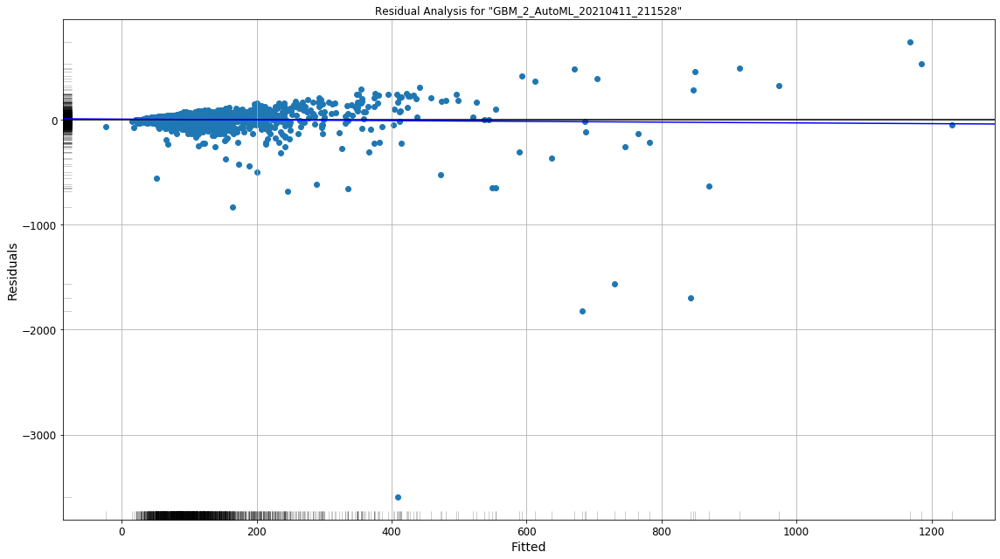

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

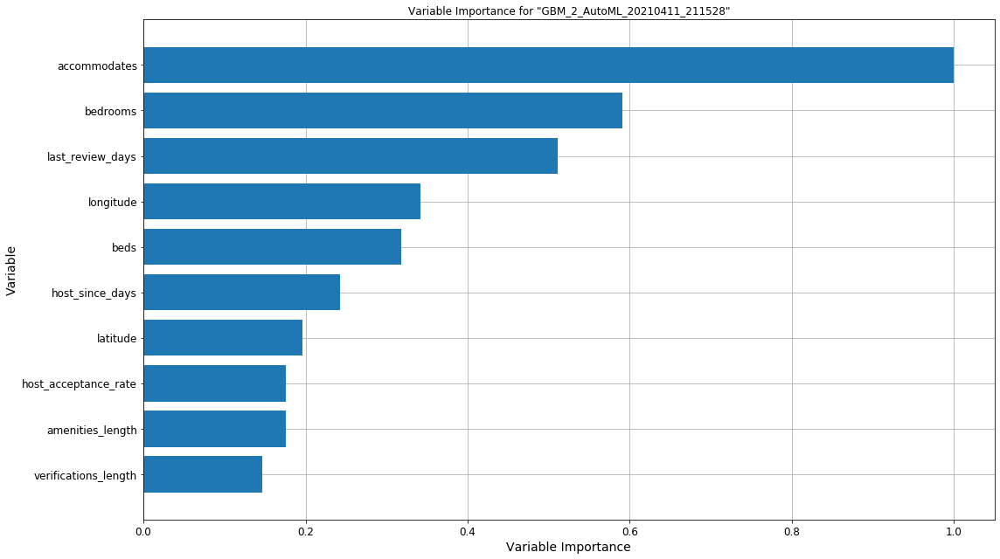

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

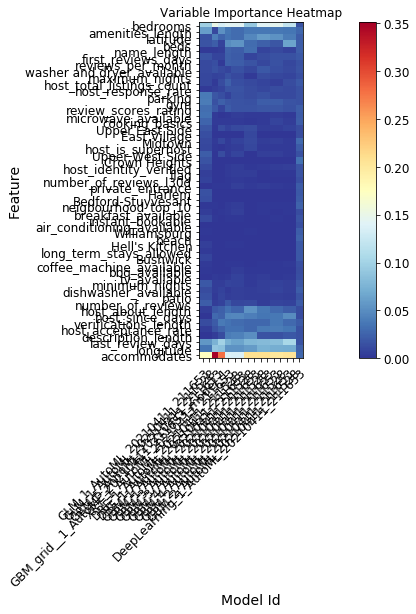

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

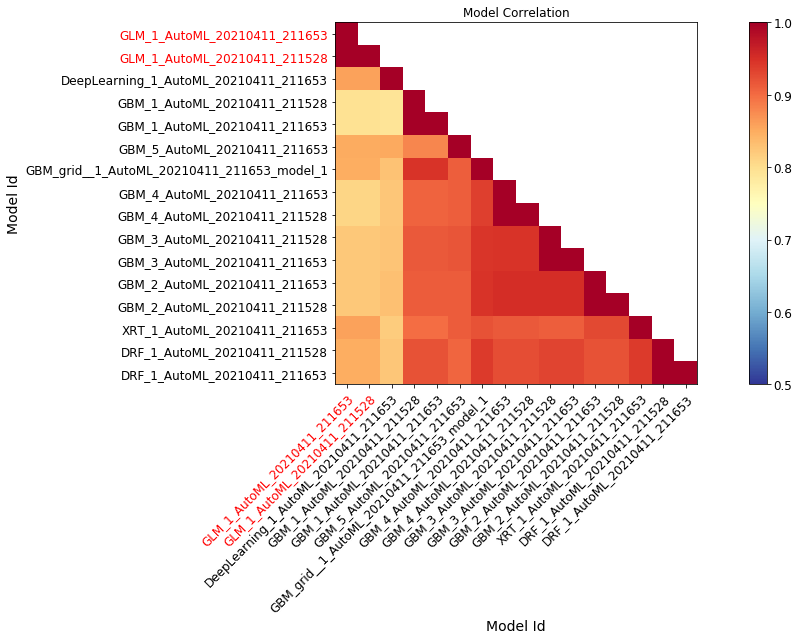

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

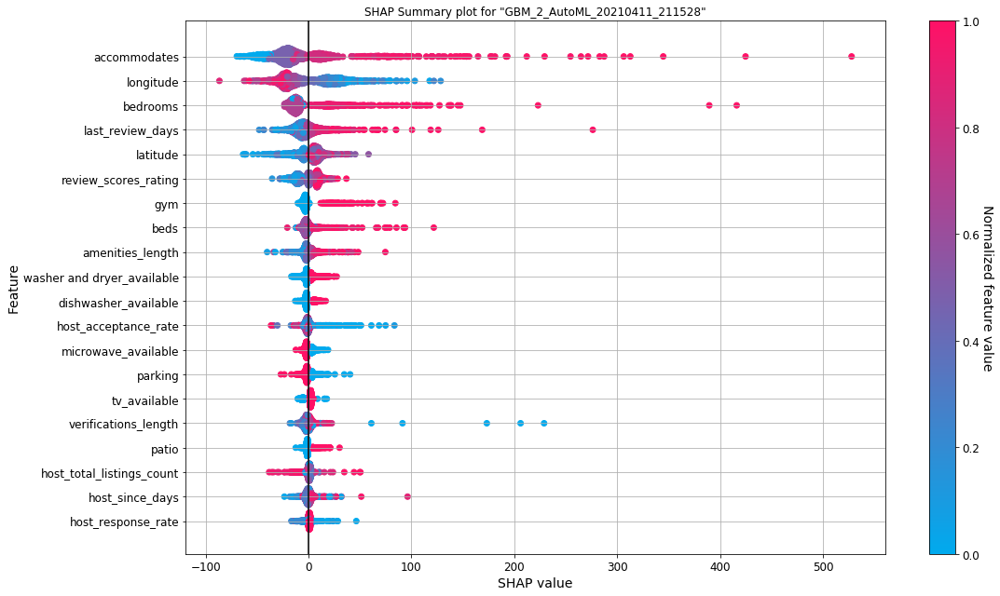

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

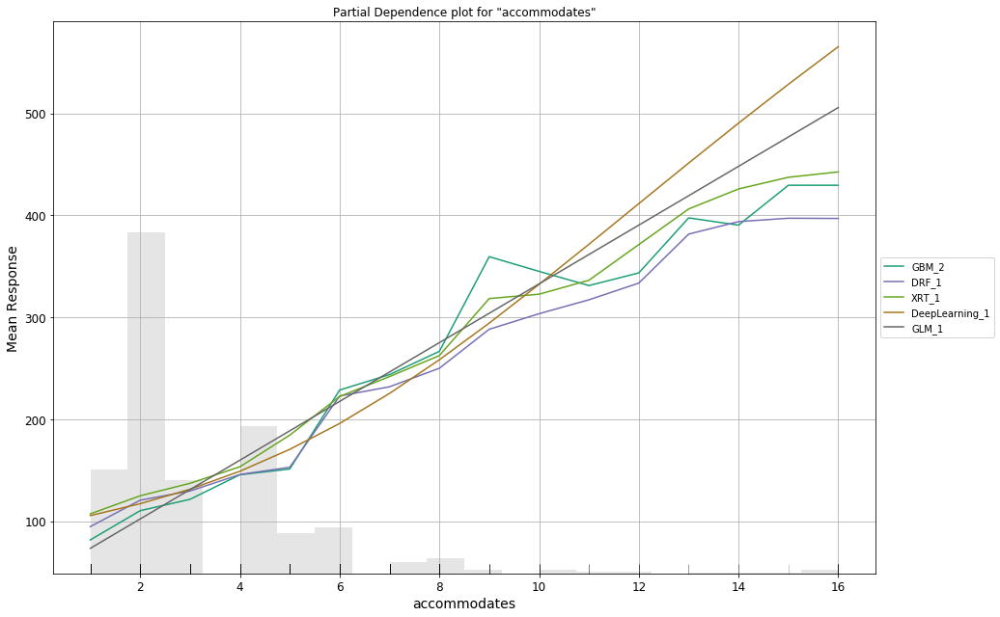

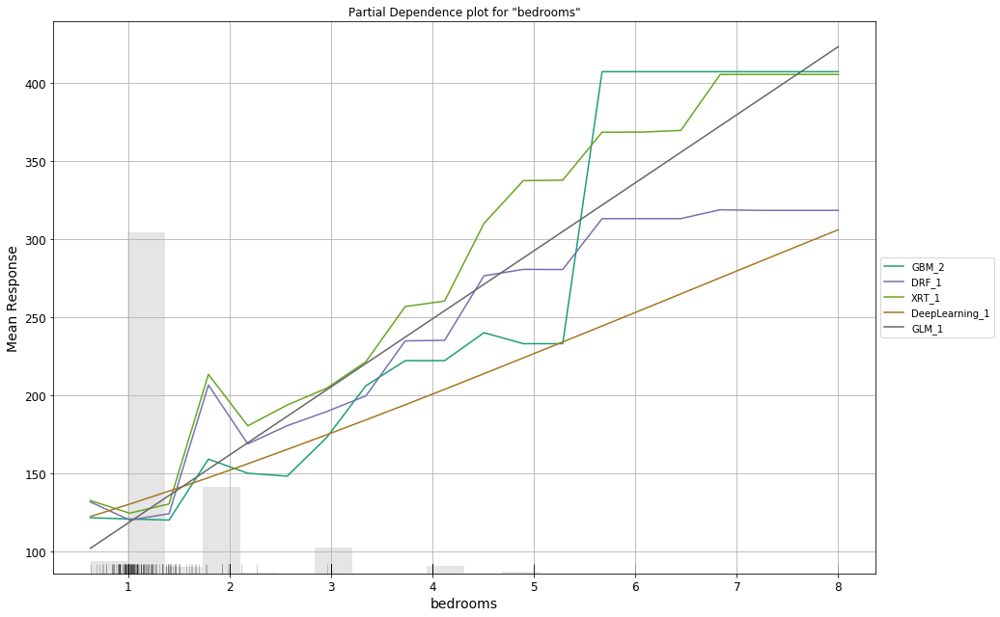

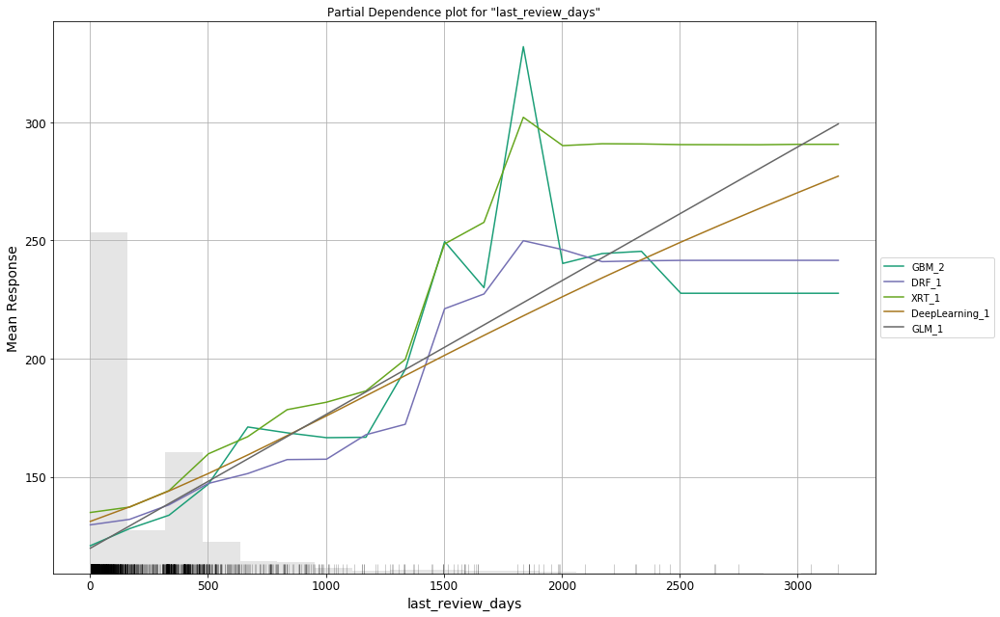

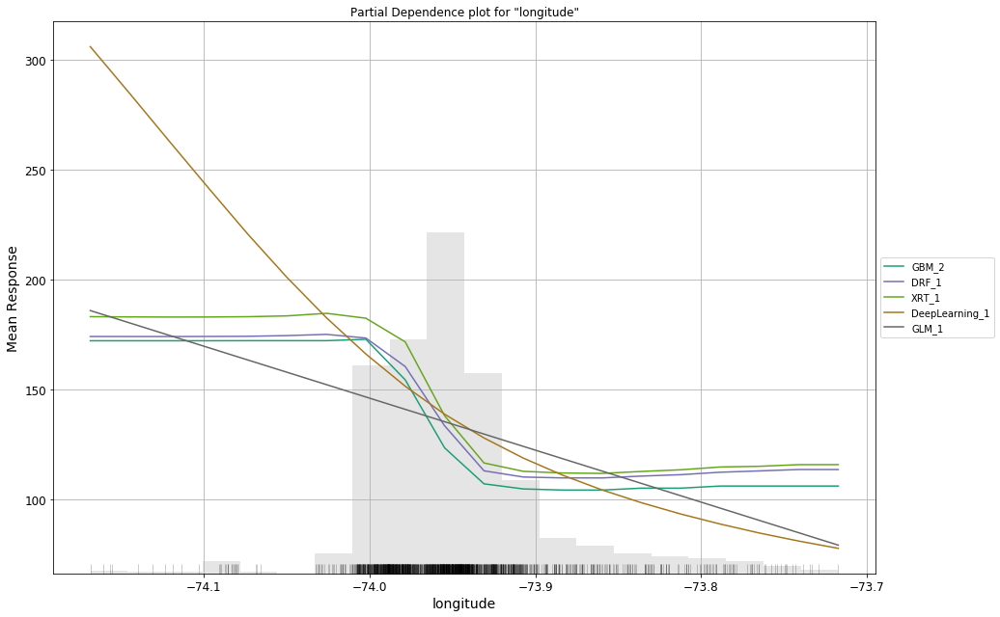

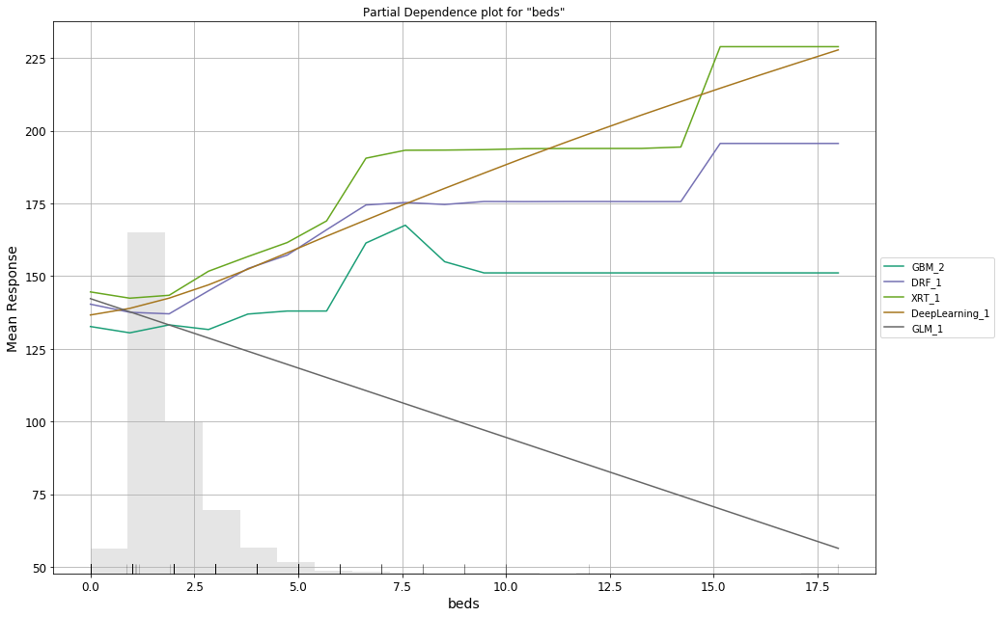

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

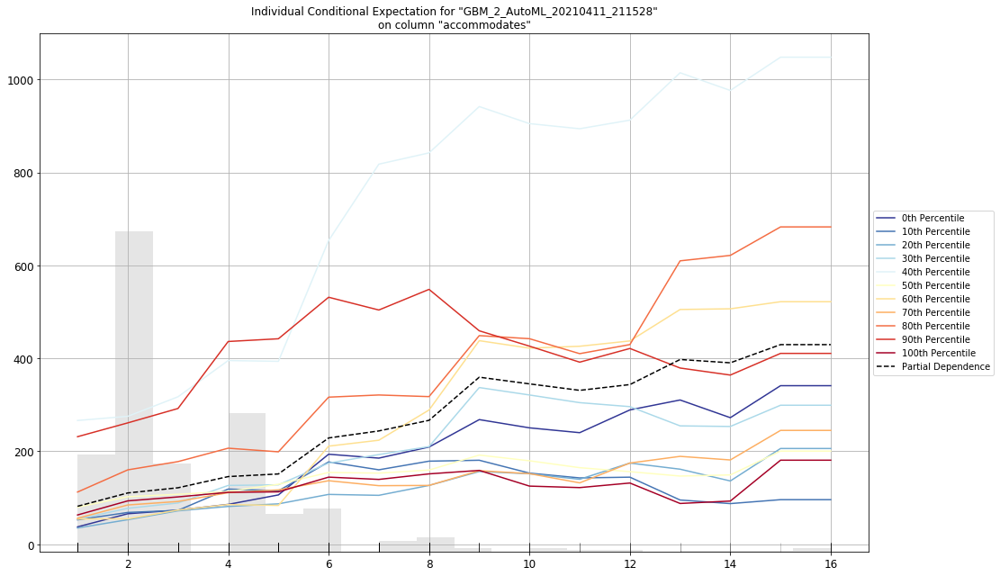

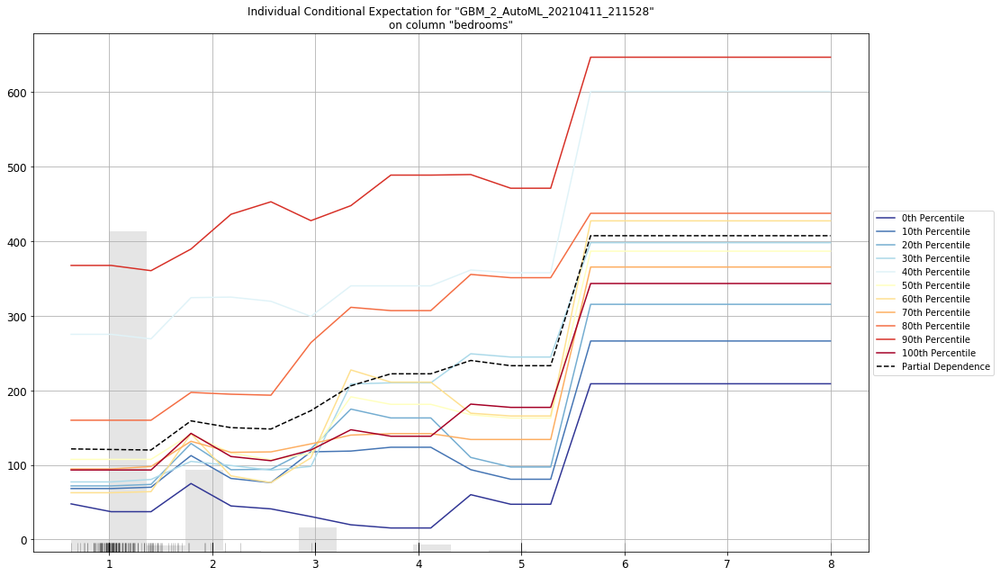

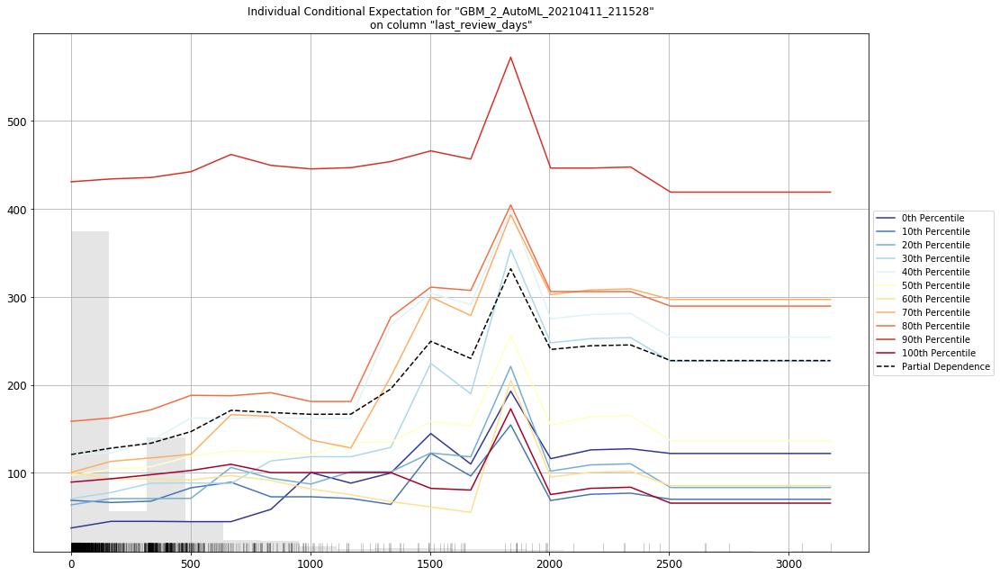

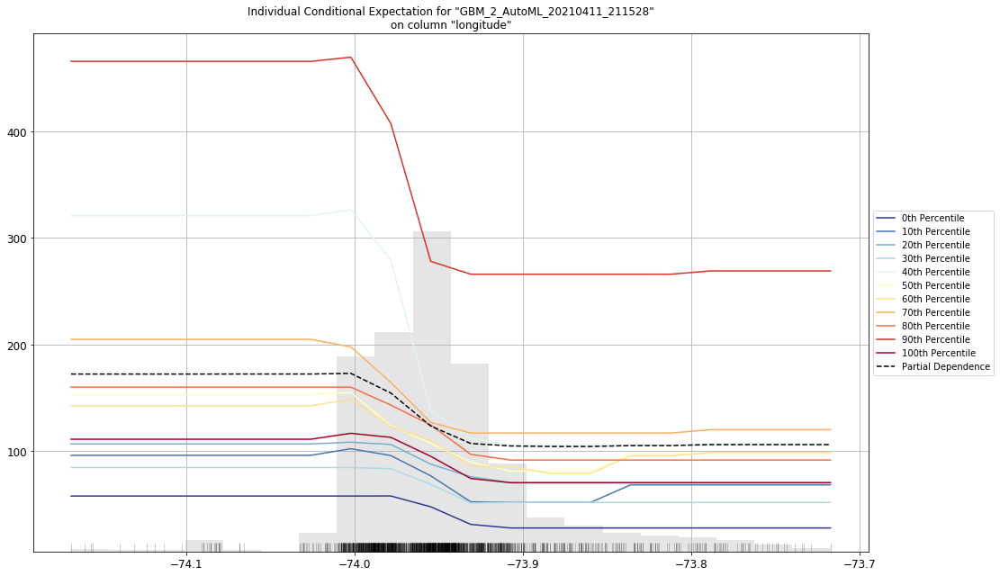

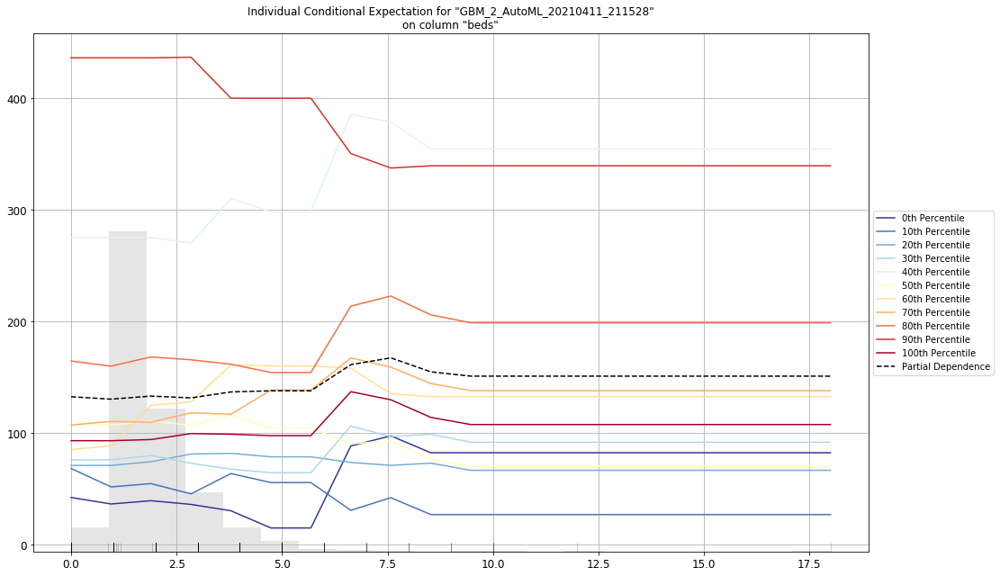

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
GBM_2_AutoML_20210411_211528,15923.8,126.19,15923.8,53.2565,nan,1604,0.006615,GBM
GBM_2_AutoML_20210411_211653,15923.8,126.19,15923.8,53.2565,nan,1286,0.003472,GBM
DRF_1_AutoML_20210411_211653,16050.4,126.69,16050.4,52.2755,0.445243,6048,0.004321,DRF
DRF_1_AutoML_20210411_211528,16050.4,126.69,16050.4,52.2755,0.445243,8882,0.004689,DRF
GBM_4_AutoML_20210411_211528,16090.9,126.85,16090.9,52.7316,nan,1673,0.004461,GBM
GBM_4_AutoML_20210411_211653,16090.9,126.85,16090.9,52.7316,nan,1744,0.004288,GBM
GBM_3_AutoML_20210411_211653,16193.1,127.252,16193.1,53.2394,nan,1277,0.004102,GBM
GBM_3_AutoML_20210411_211528,16193.1,127.252,16193.1,53.2394,nan,1507,0.004103,GBM
GBM_1_AutoML_20210411_211653,16282.9,127.604,16282.9,52.2298,0.451426,1039,0.003501,GBM
GBM_1_AutoML_20210411_211528,16282.9,127.604,16282.9,52.2298,0.451426,1456,0.003837,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

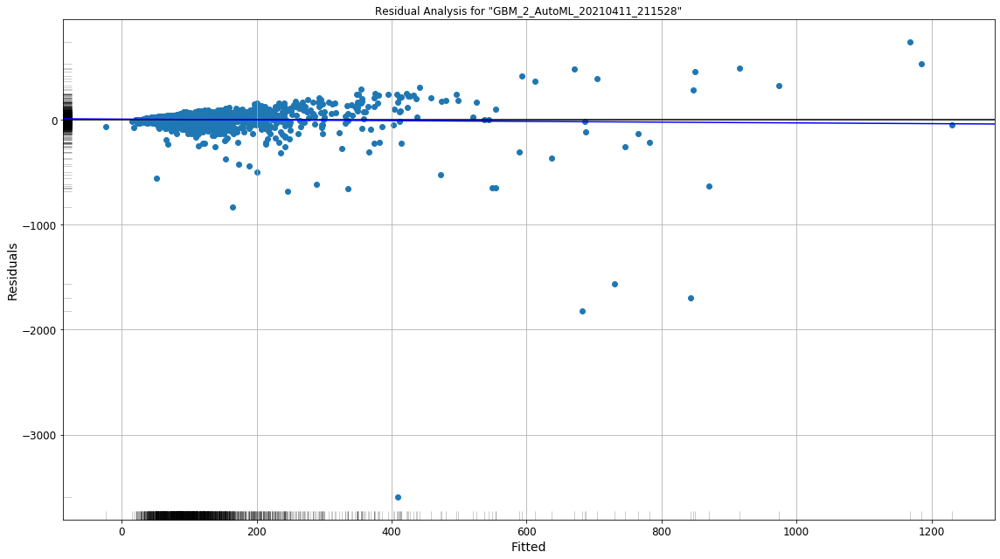

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

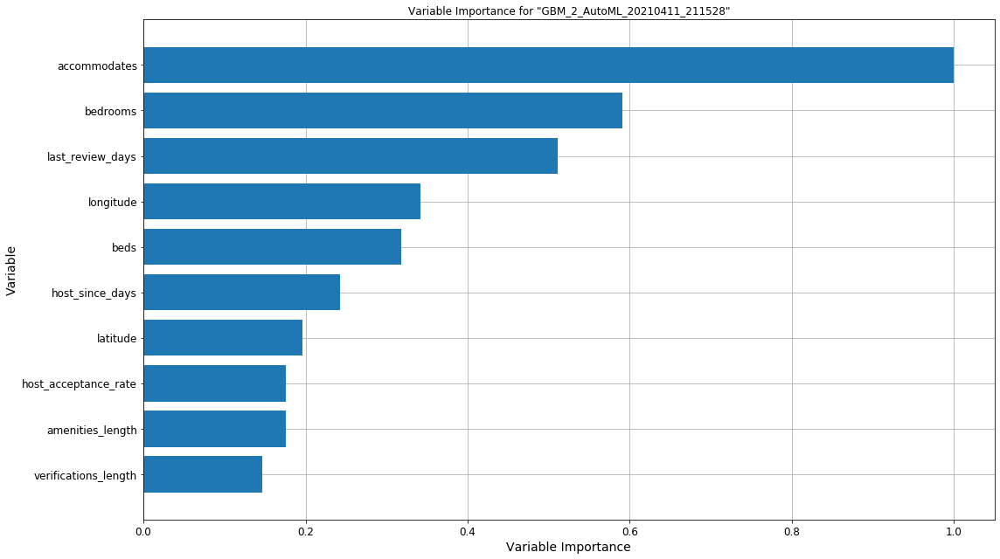

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

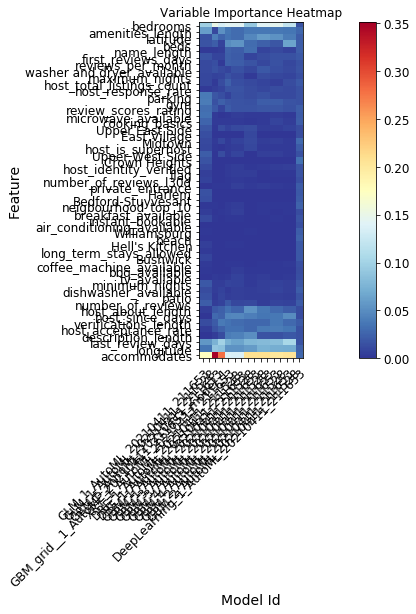

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

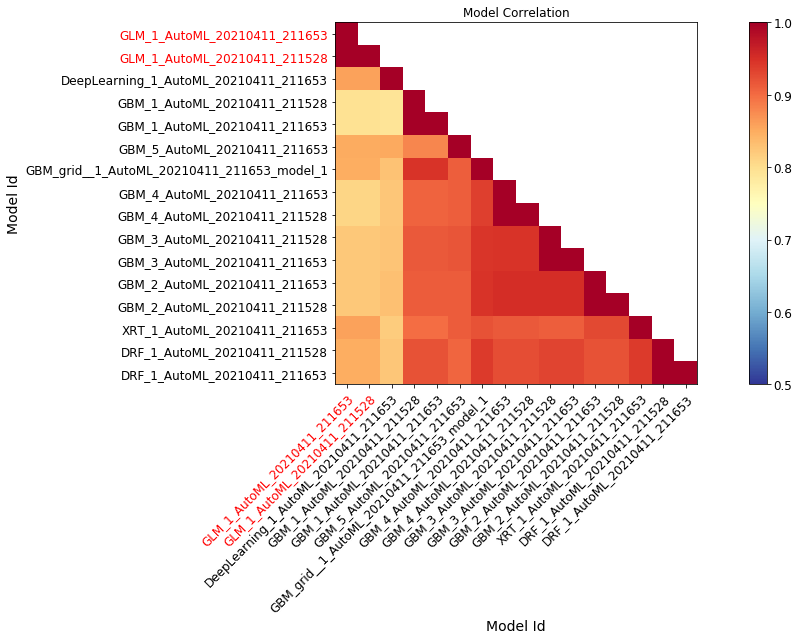

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

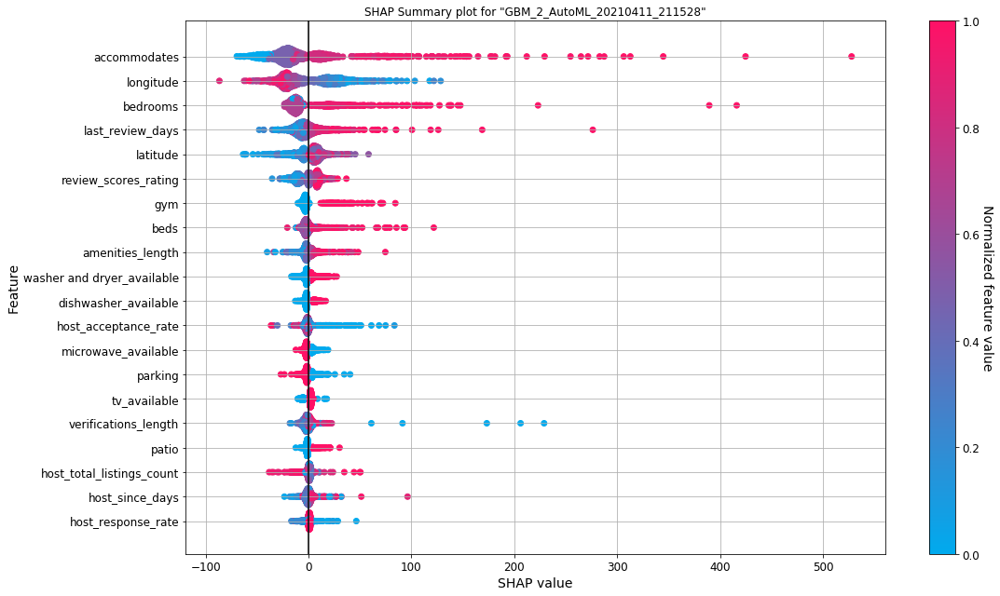

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

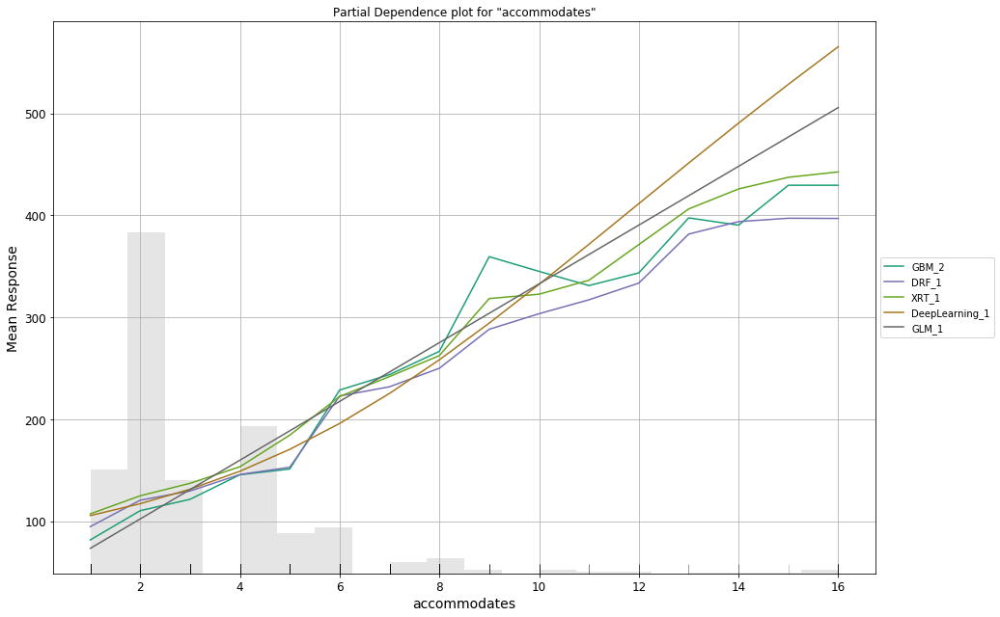

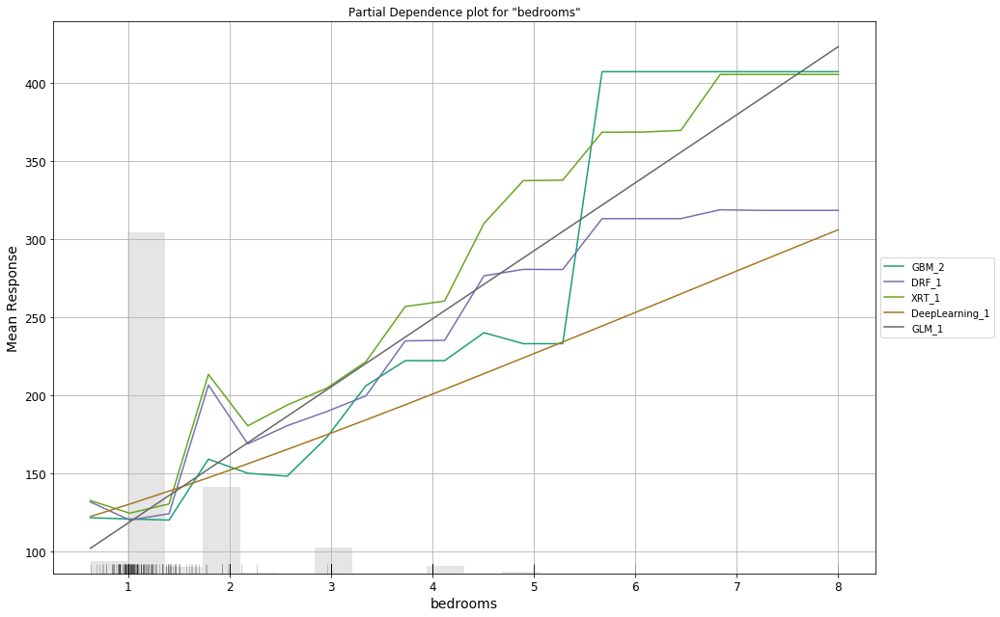

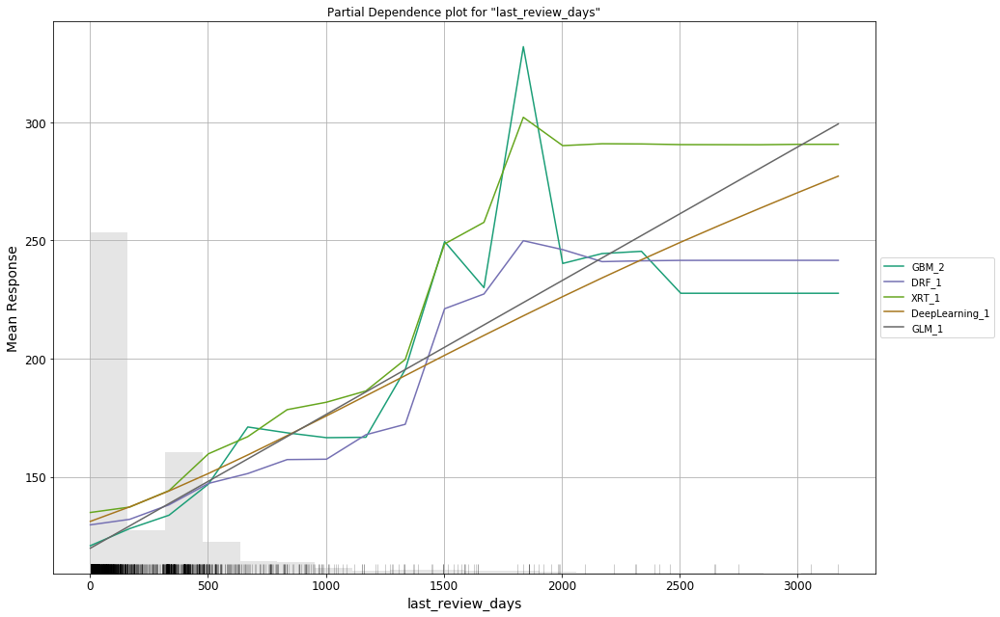

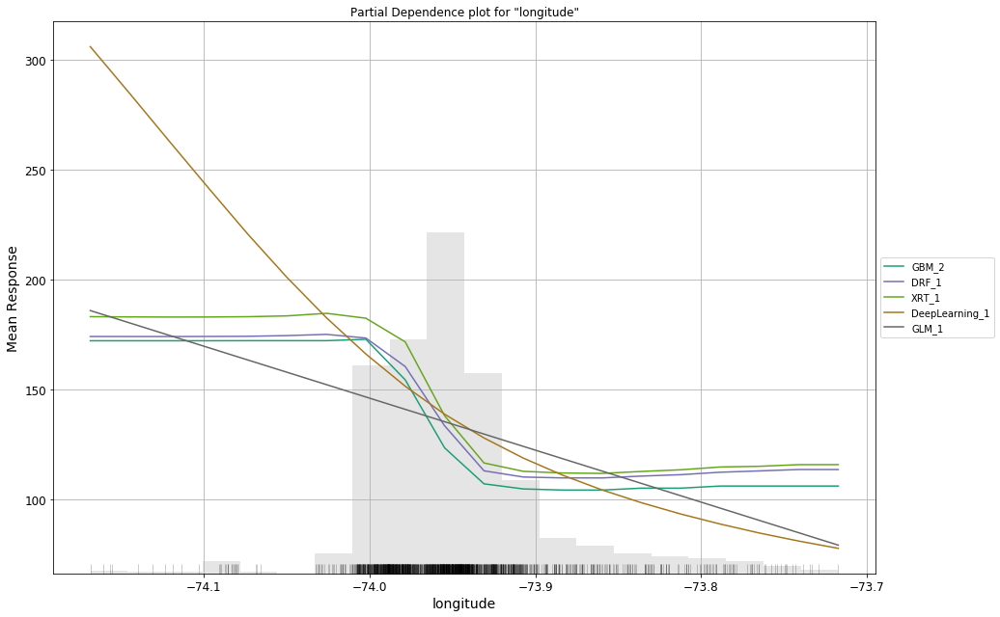

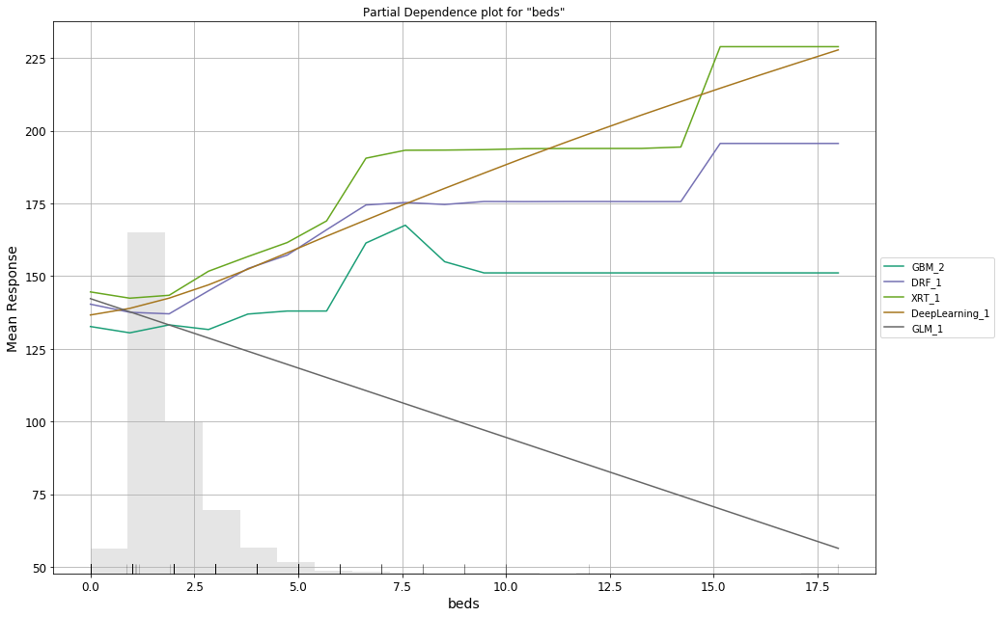

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

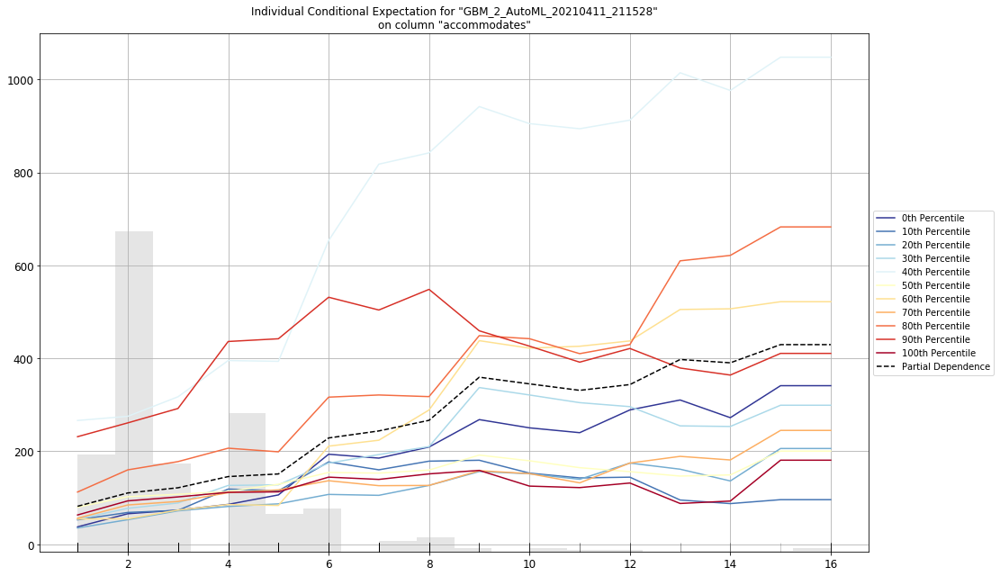

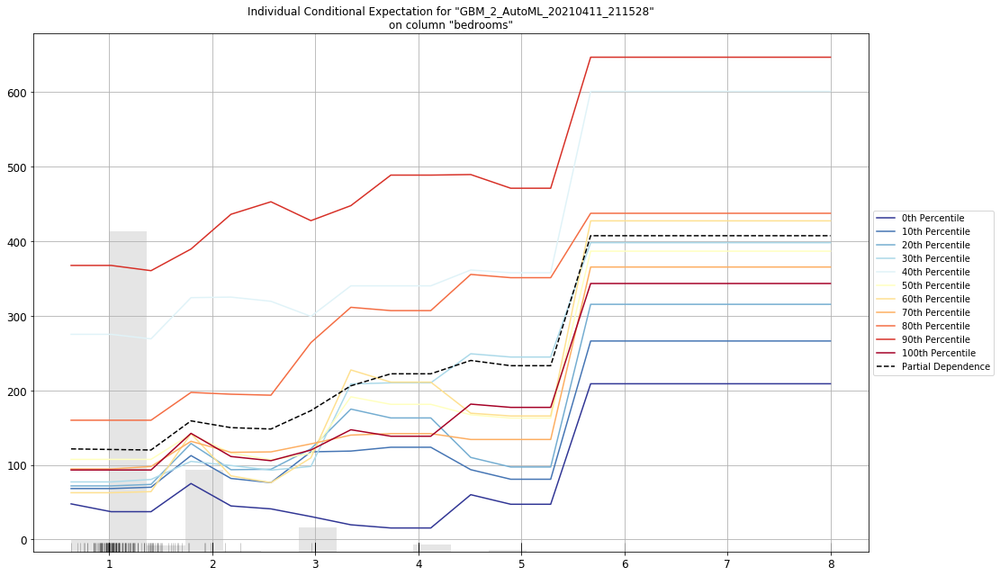

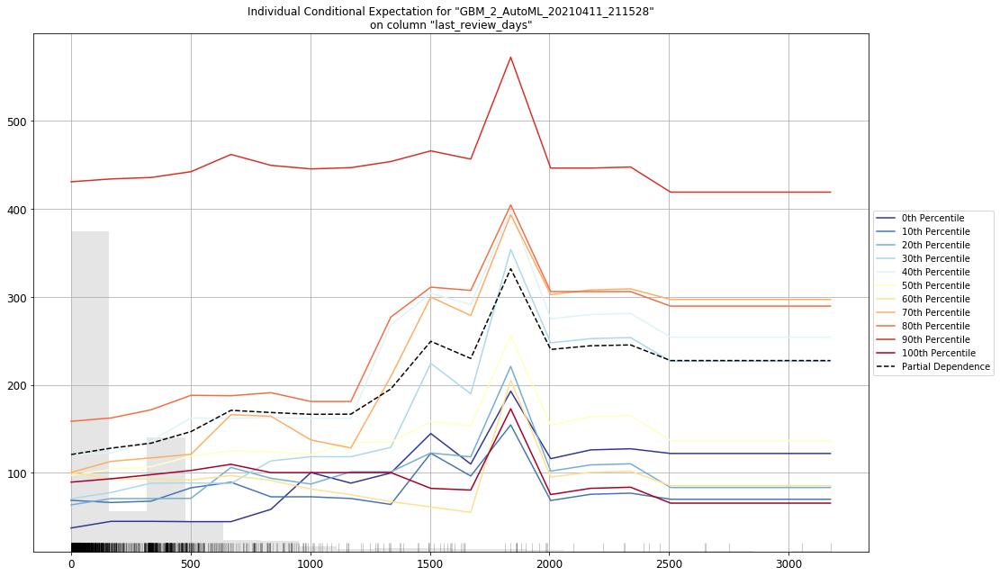

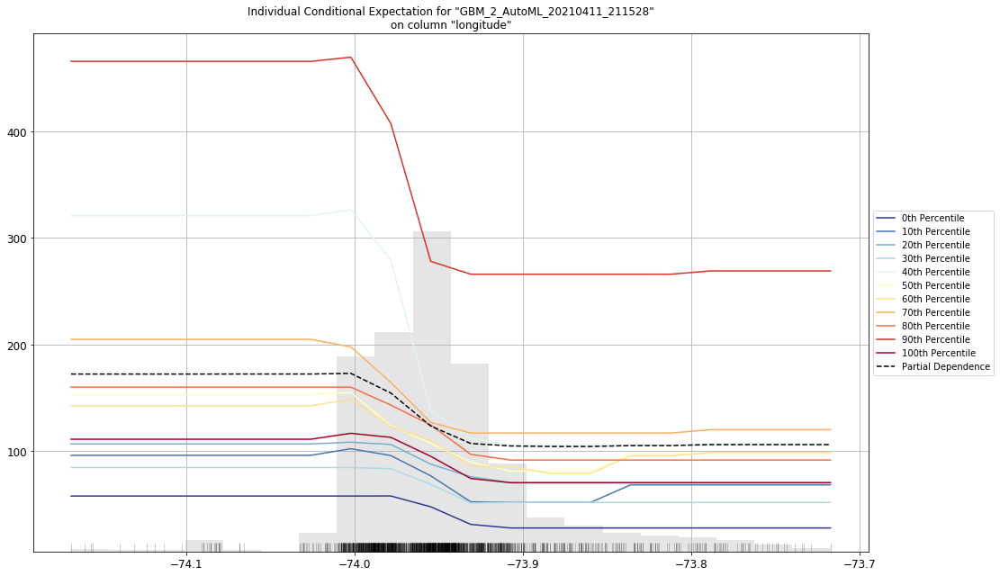

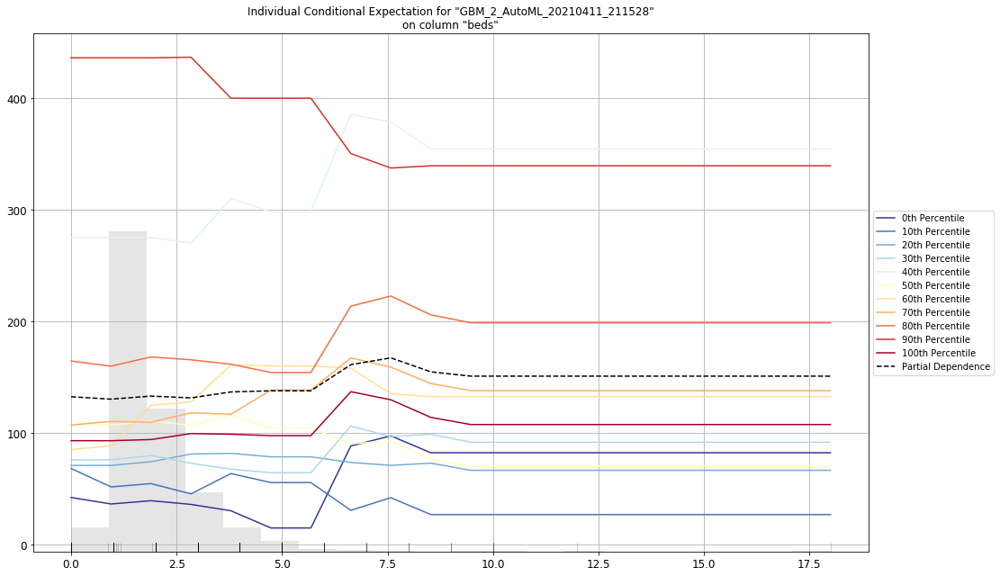

In [144]:
aml.explain(test)

**INSIGHTS:**

**Now that we have an idea of what model will perform best, we can go ahead with building of the model**

## Model Building

## Use Case 1:  For Existing Airbnb Hosts Who Want to Adjust their Prices

**RANDOM FOREST**

In [550]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=0)
rf.fit(X_train_std, y_train)

RandomForestRegressor(random_state=0)

In [551]:
X_test_sd.shape

(11103, 50)

In [552]:
from sklearn.metrics import mean_squared_error
pred1 = rf.predict(X_test_sd)
rf_mse = mean_squared_error(y_test, pred1)
rf_rmse = np.sqrt(rf_mse)
rf_rmse

250.9798584239464

**SVR**

In [564]:
from sklearn.svm import SVR

svm_reg = SVR(kernel="linear")
svm_reg.fit(X_train_std, y_train)
predictions = svm_reg.predict(X_test_sd)
svm_mse = mean_squared_error(y_test, pred1)
svm_rmse = np.sqrt(svm_mse)
svm_rmse

SVR(kernel='linear')

250.9798584239464

**XGBoost**

In [556]:
import xgboost as xgb
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror')
xg_reg.fit(X_train_std, y_train)

preds = xg_reg.predict(X_test_sd)
rmse = np.sqrt(mean_squared_error(y_test, preds))
rmse

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

269.75597642874243

In [554]:
from sklearn.ensemble import GradientBoostingRegressor


gbt = GradientBoostingRegressor(random_state=0)
model2 = gbt.fit(X_train_std,y_train)
y_test_pred_gbt = model2.predict(X_test_sd)
gbt_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_gbt))
gbt_rmse

249.95576221848762

In [563]:
from lightgbm import LGBMRegressor
# fit the model on the whole dataset
lgbm_reg_model = LGBMRegressor()
lgbm_reg_model.fit(X_train_std, y_train)

#Testing
lgbm_reg_pred = lgbm_reg_model.predict(X_test_sd)
lgbm_reg_mse = mean_squared_error(y_test, lgbm_reg_pred)
lgbm_reg_rmse = np.sqrt(lgbm_reg_mse)
lgbm_reg_rmse

LGBMRegressor()

264.5811191127423

In [565]:
df = {'Models': ["Random Forest Regressor","Gradient Boosting Regressor", 'XG Boost','LightGBM','SVR'],
     'RMSE': [250.98,249.96,269.76,264.58,250.98],
     }

summary = pd.DataFrame(df)

<Figure size 576x432 with 0 Axes>

Text(0.5, 0, 'RMSE')

Text(0, 0.5, 'Models')

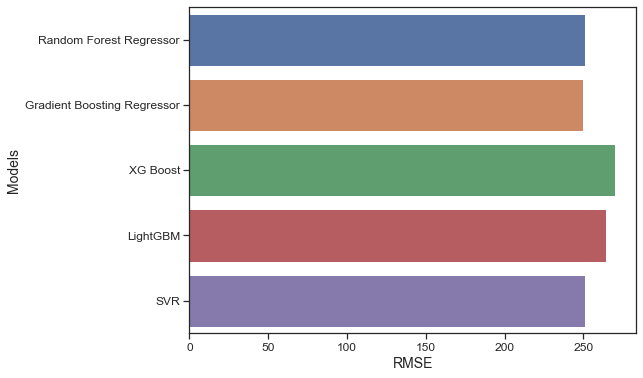

In [566]:
plt.figure(figsize=(8, 6))
splot=sns.barplot(x="RMSE",y="Models",data=summary)
plt.xlabel("RMSE", size=14)
plt.ylabel("Models", size=14)

### Hyperparameter Tuning with MLFlow

In [82]:
!pip install mlflow
!pip install hyperopt

In [561]:
import mlflow
import mlflow.pyfunc
import mlflow.sklearn
from sklearn.model_selection import cross_val_score
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from hyperopt.pyll import scope
from IPython.display import Image
import numpy as np
import lightgbm as lgb
from lightgbm import LGBMModel,LGBMClassifier
from math import exp
import mlflow.xgboost
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error

search_space = {"max_depth":scope.int(hp.quniform("max_depth",2,100,5)),
                "n_estimators":scope.int(hp.quniform("n_estimators",2,100,1)),
                #"num_leaves": scope.int(hp.quniform("num_leaves",2,50,1)),
                "reg_alpha": hp.loguniform('reg_li',-5,5),
                "random_state":1,
                "learning_rate": hp.loguniform("learning_rate", np.log(0.01), np.log(0.5)),
                "min_child_weight": hp.uniform('min_child_weight', 0.5, 10),
                #"boosting": hp.choice("boosting",["gbdt","dart","goss"]),
                "objective":"reg:squarederror"
}

def train_model(parameters):
    mlflow.xgboost.autolog()
    with mlflow.start_run(nested=True):
        booster = xgb.XGBRegressor()
        booster.set_params(**parameters)
        booster.fit(X_train_std,y_train)
        
        mlflow.log_params(parameters)
        
        score = cross_val_score(booster, X_train_std, y_train, cv=5, 
                               scoring = "neg_mean_squared_error",n_jobs=-1)
        mean_score = np.mean(score)
        
        mlflow.log_metric('neg_mean_squared_error', mean_score)
        
        return{'status':STATUS_OK,
               "loss":-1*mean_score,
               'booster':booster.get_params}
    
with mlflow.start_run(run_name='airbnb'):
    best_params = fmin(
        fn=train_model,
        space=search_space,
        algo=tpe.suggest,
        max_evals = 5,
        trials = Trials(),
        rstate=np.random.RandomState(1)
    )

  0%|                                                                            | 0/5 [00:00<?, ?trial/s, best loss=?]

job exception: A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.



  0%|                                                                            | 0/5 [00:14<?, ?trial/s, best loss=?]


BrokenProcessPool: A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.

In [559]:
import mlflow
import mlflow.pyfunc
import mlflow.sklearn
from sklearn.model_selection import cross_val_score
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from hyperopt.pyll import scope
from IPython.display import Image
import numpy as np
import lightgbm as lgb
from lightgbm import LGBMModel,LGBMClassifier
from math import exp
import mlflow.xgboost
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error

search_space = {"max_depth":scope.int(hp.quniform("max_depth",2,100,5)),
                "n_estimators":scope.int(hp.quniform("n_estimators",2,100,1)),
                #"num_leaves": scope.int(hp.quniform("num_leaves",2,50,1)),
                "reg_alpha": hp.loguniform('reg_li',-5,5),
                "random_state":1,
                "learning_rate": hp.loguniform("learning_rate", np.log(0.01), np.log(0.5)),
                "min_child_weight": hp.uniform('min_child_weight', 0.5, 10),
                #"boosting": hp.choice("boosting",["gbdt","dart","goss"]),
                "objective":"reg:squarederror"
}

def train_model(parameters):
    mlflow.xgboost.autolog()
    with mlflow.start_run(nested=True):
        booster = xgb.XGBRegressor()
        booster.set_params(**parameters)
        booster.fit(X_train_std,y_train)
        
        mlflow.log_params(parameters)
        
        score = cross_val_score(booster, X_train_std, y_train, cv=5, 
                               scoring = "neg_mean_squared_error",n_jobs=-1)
        mean_score = np.mean(score)
        
        mlflow.log_metric('neg_mean_squared_error', mean_score)
        
        return{'status':STATUS_OK,
               "loss":-1*mean_score,
               'booster':booster.get_params}
    
with mlflow.start_run(run_name='airbnb'):
    best_params = fmin(
        fn=train_model,
        space=search_space,
        algo=tpe.suggest,
        max_evals = 5,
        trials = Trials(),
        rstate=np.random.RandomState(1)
    )

  0%|                                                                            | 0/5 [00:00<?, ?trial/s, best loss=?]

job exception: A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.



  0%|                                                                            | 0/5 [00:12<?, ?trial/s, best loss=?]


BrokenProcessPool: A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.

In [ ]:
!mlflow ui

In [560]:
from hyperopt import fmin, tpe, hp, SparkTrials, Trials, STATUS_OK
from hyperopt.pyll import scope
from math import exp
import mlflow.xgboost
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error

def params_to_xgb(params):
    return{
        'objective': 'reg:squarederror',
        #'eval_metric': 'rmse',
        'max_depth': int(params['max_depth']),
        'learning_rate': exp(params['learning_rate']),
        'reg_alpha': exp(params['reg_alpha']),
        'reg_lambda': exp(params['reg_lambda']),
        'gamma': exp(params['gamma']),
        'min_child_weight': exp(params['min_child_weight']),
       # 'importance_type': 'total_gain',
        'seed': 0
  }

search_space = {
  'max_depth': hp.quniform('max_depth', 20, 60, 1),
  'learning_rate': hp.uniform('learning_rate', -3, 0),
  'reg_alpha': hp.uniform('reg_alpha', -5, -1),
  'reg_lambda': hp.uniform('reg_lambda', -6, -1),
  'gamma': hp.uniform('gamma', -6, -1),
  'min_child_weight': hp.uniform('min_child_weight', -1, 3),
  'n_jobs': -1,
  'objective': 'reg:squarederror',
  'seed': 123,
}

def train_model(params):
    mlflow.xgboost.autolog()
    with mlflow.start_run(nested=True):
        train=xgb.DMatrix(data=X_train_std, label=y_train)
        test=xgb.DMatrix(data=X_test_sd, label=y_test)
        booster = xgb.train(params=params_to_xgb(params), dtrain=train, num_boost_round=10,\
                            evals=[(test, "test"), (train, "train")], early_stopping_rounds=50)
        predictions = booster.predict(test)
        mse = mean_squared_error(y_test, predictions)
        mlflow.log_metric('mse', mse)
        mlflow.log_params(params_to_xgb(params))

        signature=infer_signature(train, booster.predict(train))
        mlflow.xgboost.log_model(booster, 'model', signature=signature)

        #mlflow.log_param('best_iteration', booster.attr('best_iteration'))
        return {'status':STATUS_OK, 'loss': -1*mse, 'booster':booster.attributes()}

#spark_trials = SparkTrials(parallelism=4)

with mlflow.start_run():
    best_params = fmin(fn=train_model, space=search_space, algo=tpe.suggest, max_evals=10, rstate=np.random.RandomState(123))

[0]	test-rmse:285.27533	train-rmse:92.60854                                                                            

[1]	test-rmse:287.69138	train-rmse:35.07541                                                                            

[2]	test-rmse:296.09882	train-rmse:13.35727                                                                            

[3]	test-rmse:297.59680	train-rmse:5.11641                                                                             

[4]	test-rmse:298.22507	train-rmse:1.97024                                                                             

[5]	test-rmse:298.35489	train-rmse:0.76755                                                                             

[6]	test-rmse:298.46872	train-rmse:0.30769                                                                             

[7]	test-rmse:298.50558	train-rmse:0.13319                                                                             

[8]	test-rmse:298.51315	train-rm

job exception: name 'infer_signature' is not defined



  0%|                                                                           | 0/10 [00:04<?, ?trial/s, best loss=?]


NameError: name 'infer_signature' is not defined

### Final Model for Use Case 1
**Test Model on Test Set**

### Pre-Process Test Set

In [83]:
#Flag Missing Values
miss_values = missing_values(test_set)
cols = miss_values.index
df_try = test_set[cols].isnull().astype(int).add_suffix('_indicator')

#merge both the df1 and the flagged columns
test_set = pd.merge(test_set, df_try, left_index=True, right_index=True)

#Iterative Imputer
df_num = test_set.drop(columns=['host_response_time', 'neighbourhood_group_cleansed','name_bath', 'room_type'])
imp = IterativeImputer(random_state=0)
df_num1 = imp.fit_transform(df_num)
cols = list(df_num)
df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols
test_set[cols] = df_num1[cols].values

#categorical encoding
test_set['host_response_time'] = test_set['host_response_time'].fillna("within an hour")
test_set = pd.get_dummies(test_set, columns=['host_response_time','neighbourhood_group_cleansed','name_bath', 'room_type'])

#drop correlated variables
#val = val.drop(['Complain_0','Gender_Male','CityTier_3', 'PreferredLoginDevice_Computer'], axis=1)

#Separate Features and Target
y_test = test_set['price']
X_test = test_set.drop(columns=['price'])

#drop most useless variables from feature selection
#X_val = X_val.drop(['PreferedOrderCat_Others','PreferedOrderCat_Grocery','CityTier_2','MaritalStatus_Divorced','PreferredPaymentMode_UPI','PreferedOrderCat_Fashion'], axis=1)

#standardize the data
sc = StandardScaler()
X_test_std = sc.fit_transform(X_test)

Dataframe has 57 columns.
There are 18 columns that have missing values.


**Test Model on Test Set**

In [ ]:
Test the model here

## Use Case 2:  New Airbnb Users Who Want to Know What Price to Set for their New Listing

**Edit the X_train to exclude data that may cause data leakage**

**RANDOM FOREST**

**SVR**

**XGBOOST**

**HYPERPAREMETER TUNING WITH MLFLOW HYPEROPT**

**TEST FINAL MODEL ON TEST SET**

# ~ EXTRA ~

In [77]:
#Get the statistic value for each numerical columns
df1.describe()

,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_identity_verified,latitude,longitude,accommodates,bedrooms,beds,...,neigbourhood_top_10,flag,host_response_time_indicator,host_response_rate_indicator,host_acceptance_rate_indicator,bedrooms_indicator,description_indicator,beds_indicator,bathrooms_text_indicator,name_indicator
count,2.662800e+04,2.662800e+04,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,...,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.0,26628.0
mean,2.155454e+01,3.312656e+01,0.244179,9.837652,0.808097,40.728428,-73.949712,2.866006,1.296017,1.562282,...,0.461657,0.294277,0.490236,0.490236,0.352974,0.094637,0.017162,0.004845,0.0,0.0
std,9.688831e+03,6.339765e+03,0.429607,80.418748,0.393805,0.055751,0.049463,1.845233,0.736289,1.158847,...,0.498537,0.455725,0.499914,0.499914,0.477904,0.292719,0.129879,0.069435,0.0,0.0
min,-1.580810e+06,-1.034357e+06,0.000000,0.000000,0.000000,40.508680,-74.239860,1.000000,0.502217,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,6.889981e+01,5.434775e+01,0.000000,1.000000,1.000000,40.688250,-73.983072,2.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
50%,8.797556e+01,7.800000e+01,0.000000,1.000000,1.000000,40.723125,-73.954725,2.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
75%,1.000000e+02,9.800000e+01,0.000000,2.000000,1.000000,40.762593,-73.932540,4.000000,1.055631,2.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.0
max,1.091831e+02,1.098492e+02,1.000000,2739.000000,1.000000,40.910780,-73.710870,16.000000,50.412039,42.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,0.0


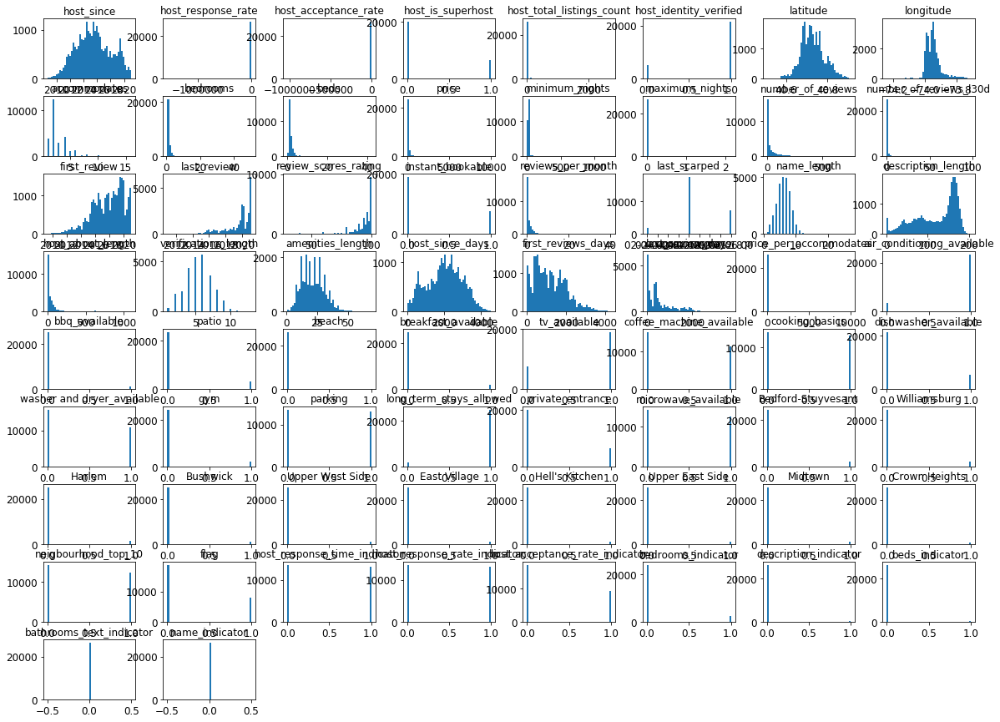

<Figure size 432x288 with 0 Axes>

In [78]:
# Get the numerical columns' distribution
import matplotlib.pyplot as plt
df1.hist(bins=50, figsize=(20,15),grid=False)

plt.show()
plt.savefig("attribute_histogram_plots.png")

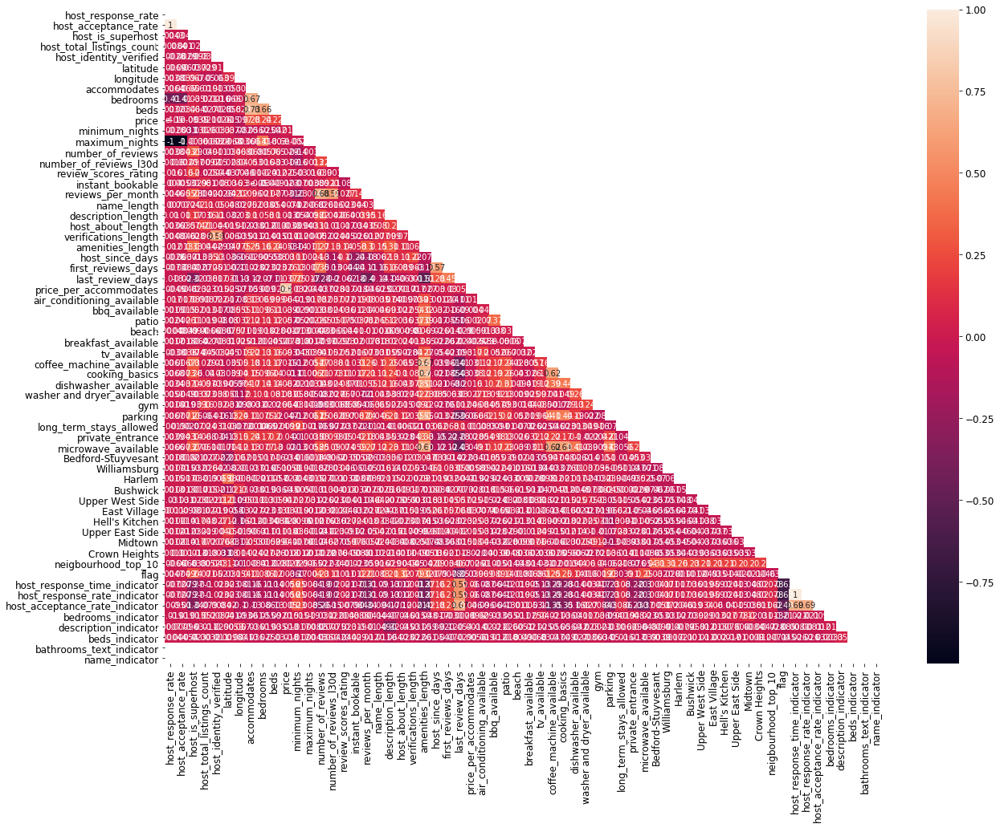

In [79]:
#Plot the correlation plot among the numerical varaibles
import seaborn as sns
matrix = np.triu(df1.corr())
fig, ax = plt.subplots(figsize=(20,15))
sns.heatmap(df1.corr(), annot = True,mask=matrix)

fig.show()
plt.savefig("correlation_plot")

### 4. Split test and train sets

In [80]:
# to make this notebook's output identical at every run
np.random.seed(42)

In [81]:
df_drop_na=df1.dropna()

In [82]:
df_drop_na.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8911 entries, 0 to 26630
Data columns (total 81 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   last_scraped                    8911 non-null   object        
 1   name                            8911 non-null   object        
 2   description                     8911 non-null   object        
 3   host_name                       8911 non-null   object        
 4   host_since                      8911 non-null   datetime64[ns]
 5   host_about                      8911 non-null   object        
 6   host_response_time              8911 non-null   object        
 7   host_response_rate              8911 non-null   float64       
 8   host_acceptance_rate            8911 non-null   float64       
 9   host_is_superhost               8911 non-null   float64       
 10  host_total_listings_count       8911 non-null   float64       
 11  hos

# Discover and visualize the data to gain insights

### 1. Draw the word cloud for text variables

### 3. Get the general insight for Airbnb dataset

In [76]:
#get the data type for each column of variable
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26628 entries, 0 to 26632
Data columns (total 81 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   last_scraped                    26628 non-null  object        
 1   name                            26628 non-null  object        
 2   description                     26171 non-null  object        
 3   host_name                       26628 non-null  object        
 4   host_since                      26628 non-null  datetime64[ns]
 5   host_about                      17073 non-null  object        
 6   host_response_time              13574 non-null  object        
 7   host_response_rate              26628 non-null  float64       
 8   host_acceptance_rate            26628 non-null  float64       
 9   host_is_superhost               26628 non-null  float64       
 10  host_total_listings_count       26628 non-null  float64       
 11  ho

The word cloud for "description", <br>
which can help us to get the most popular words for hosts to describe thier Airbnb apartments.

In [111]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator, get_single_color_func
from PIL import Image
comment_words = ' '
STOPWORDS.update(['/><br','br','&'])
stopwords = set(STOPWORDS)


sentences=''
i=0
for val in df1['description']: 

   # typecaste each val to string 
    val = str(val)
    sentences=val+sentences
    i=i+1
    if i%10000==0:
        print('finished: ',i)
   # split the value 
tokens=sentences.split()

# Converts each token into lowercase 
token=[element.lower() for element in tokens]

for words in token: 
comment_words=" ".join(str(item) for item in token)
comment_words=comment_words.replace("br", "").replace('access to','access')\
.replace('you will','').replace('the apartment','apartment').replace('apartment is','apartment')
mask = np.array(Image.open("liberty_statue.jpg"))


wordcloud = WordCloud(width = 800, height =900 , 
            stopwords = stopwords, 
            max_words=800,
            background_color="white",
            colormap='RdYlGn',
            mask=mask,
            min_font_size = 5,                      
            collocations=True,
            contour_color='lightgrey',
            contour_width=1).generate(comment_words) 

# plot the WordCloud image                        
plt.figure(figsize = (50, 30)) 
plt.imshow(wordcloud) 

plt.axis("off") 
#plt.tight_layout(pad = 0) 

plt.savefig("wordcloud_desription.jpg")

plt.show()



The word cloud for "host_about", <br>
which can help us to get the most popular words for hosts to introduce themselves

In [114]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator, get_single_color_func
from PIL import Image
comment_words = ' '
STOPWORDS.update(['/><br','br','&'])
stopwords = set(STOPWORDS)

i=0
sentences=''
for val in df1['host_about']: 

   # typecaste each val to string 
    val = str(val)
    sentences=val+sentences
    i=i+1
    if i%5000==0:
        print('finished: ',i)
   # split the value 
tokens=sentences.split()

# Converts each token into lowercase 
token=[element.lower() for element in tokens]

# for words in token: 
comment_words=" ".join(str(item) for item in token)
comment_words=comment_words.replace("br", "").replace('access to','access')\
.replace('you will','').replace('the apartment','apartment').replace('apartment is','apartment').replace('je suis','')
mask = np.array(Image.open("liberty_statue.jpg"))

image_colors = ImageColorGenerator(mask)

wordcloud = WordCloud(width = 800, height =900 , 
            stopwords = stopwords, 
            max_words=1000,
            background_color="white",
            colormap='RdYlGn',
            mask=mask,
            min_font_size = 5,                      
            collocations=True,
            contour_color='lightgrey',
            contour_width=1).generate(comment_words) 


# plot the WordCloud image                        
plt.figure(figsize = (50, 30)) 
plt.imshow(wordcloud) 
plt.axis("off") 
#plt.tight_layout(pad = 0) 

plt.savefig("wordcloud_host_about")
plt.show()


The word cloud for "name", <br>
which can help us to get the most popular words for hosts to entitle thier Airbnb apartments.

In [115]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator, get_single_color_func
from PIL import Image
comment_words = ' '
STOPWORDS.update(['/><br','br','&'])
stopwords = set(STOPWORDS)


sentences=''
for val in df1['name']: 

   # typecaste each val to string 
    val = str(val)
    sentences=val+sentences
   # split the value 
tokens=sentences.split()

# Converts each token into lowercase 
token=[element.lower() for element in tokens]

# for words in token: 
comment_words=" ".join(str(item) for item in token)
comment_words=comment_words.replace("br", "").replace('access to','access')\
.replace('you will','').replace('the apartment','apartment').replace('apartment is','apartment').replace('je suis','')
mask = np.array(Image.open("liberty_statue.jpg"))

image_colors = ImageColorGenerator(mask)

wordcloud = WordCloud(width = 800, height =900 , 
            stopwords = stopwords, 
            max_words=1000,
            background_color="white",
            colormap='RdYlGn',
            mask=mask,
            min_font_size = 5,                      
            collocations=True,
            contour_color='lightgrey',
            contour_width=1).generate(comment_words) 

# plot the WordCloud image                        
plt.figure(figsize = (50, 30)) 
plt.imshow(wordcloud) 
plt.axis("off") 
#plt.tight_layout(pad = 0) 

plt.savefig("wordcloud_name")

plt.show()

### 2. Geographic Distribution

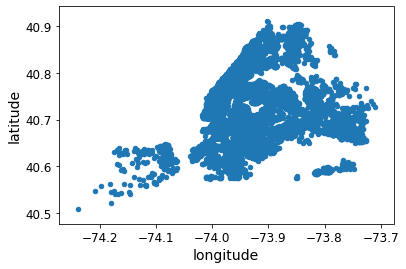

In [92]:
df1.plot(kind="scatter", x="longitude", y="latitude")
plt.savefig("bad_visualization_plot")

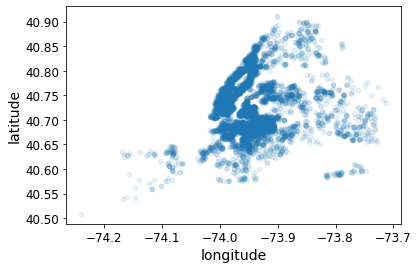

In [78]:
df1.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1)
plt.savefig("better_visualization_plot")

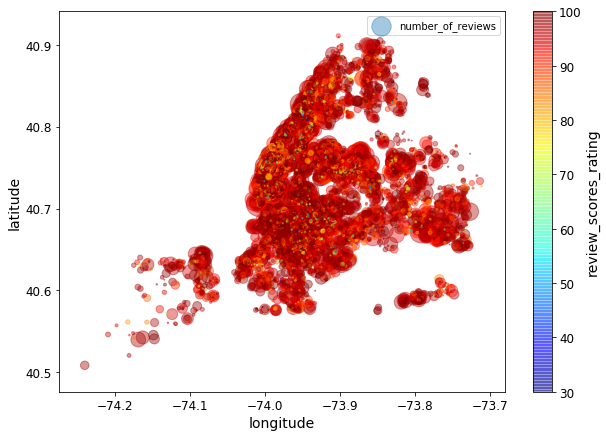

In [94]:
df1.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
    s=df1["number_of_reviews"], label="number_of_reviews", figsize=(10,7),
    c="review_scores_rating", cmap=plt.get_cmap("jet"), colorbar=True,
    sharex=False)
plt.legend()
plt.savefig("Airbnb_review_rating_scatterplot")

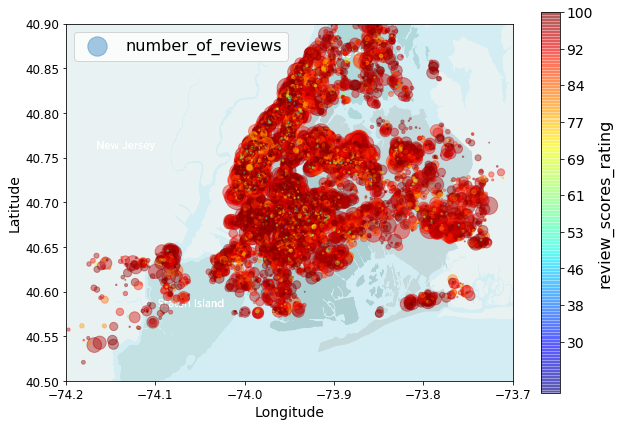

In [95]:
import matplotlib.image as mpimg
california_img=mpimg.imread('map_nyc.png')
ax = df1.plot(kind="scatter", x="longitude", y="latitude", figsize=(10,7),
                       s=df1["number_of_reviews"], label="number_of_reviews",
                       c="review_scores_rating", cmap=plt.get_cmap("jet"),
                       colorbar=False, alpha=0.4,
                      )
plt.imshow(california_img, extent=[-74.2, -73.7, 40.5, 40.90], alpha=0.4,
           cmap=plt.get_cmap("jet"))
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)

rating = df1["review_scores_rating"]
tick_values = np.linspace(rating.min(), rating.max(), 10)
cbar = plt.colorbar(ticks=tick_values/rating.max())
cbar.ax.set_yticklabels([(round(v)) for v in tick_values], fontsize=14)
cbar.set_label('review_scores_rating', fontsize=16)

plt.legend(fontsize=16)
plt.savefig("Montreal_Airbnb_review_rating_scatterplot")
plt.show()

### 3. Get the correlation value between target variable ("review_scores_rating") and other predictors

In [96]:
corr_matrix2 = df1.corr()

In [97]:
corr_matrix2["review_scores_rating"].sort_values(ascending=False)

review_scores_rating        1.000000
host_is_superhost           0.197431
amenities_length            0.142137
cooking_basics              0.106990
host_since_days             0.103837
                              ...   
Midtown                    -0.059142
last_review_days           -0.061550
instant_bookable           -0.082881
bathrooms_text_indicator         NaN
name_indicator                   NaN
Name: review_scores_rating, Length: 62, dtype: float64

In [98]:
corr_matrix["review_scores_rating"].sort_values(ascending=False)

review_scores_rating          1.000000
host_is_superhost             0.197374
amenities_length              0.142010
cooking_basics                0.106899
host_since_days               0.103854
coffee_machine_available      0.103093
parking                       0.096977
dishwasher_available          0.087185
patio                         0.075272
microwave_available           0.073876
host_response_rate            0.073592
air_conditioning_available    0.071537
washer and dryer_available    0.066928
description_length            0.063413
tv_available                  0.051847
private_entrance              0.049545
verifications_length          0.045386
number_of_reviews             0.039097
bbq_available                 0.036319
reviews_per_month             0.027216
price                         0.025329
breakfast_available           0.022979
name_length                   0.022737
price_per_accommodates        0.017253
host_about_length             0.016629
bedrooms                 

### Compare the correlation value before and after adding new features, we can see that the new feature of "amenities_length","price_per_accommodates" and "has_hair_dryer" are all the predictors have the high correlation with the target variable

### 4. Draw the scatter matrix plot for the top 4 correlated varibles with review_scores_rating

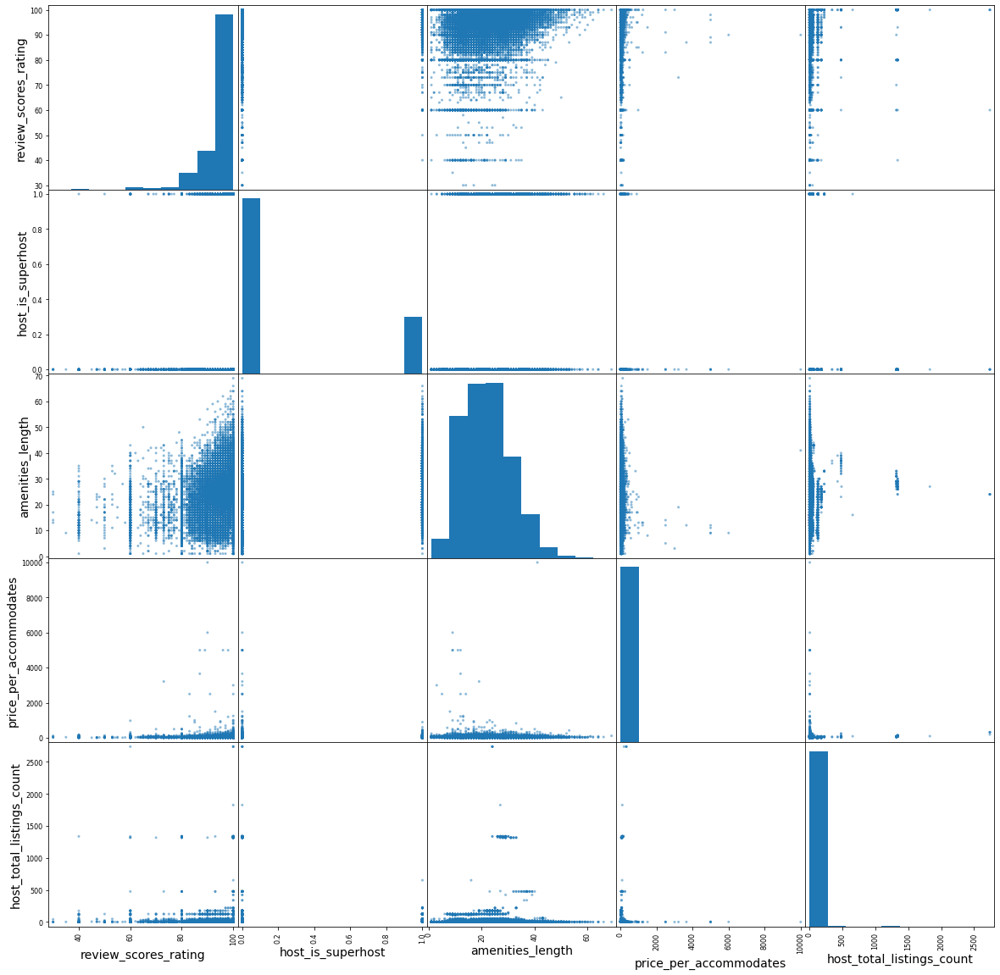

In [99]:
# from pandas.tools.plotting import scatter_matrix # For older versions of Pandas
from pandas.plotting import scatter_matrix

attributes = ["review_scores_rating", "host_is_superhost", "amenities_length",
              "price_per_accommodates",'host_total_listings_count']
scatter_matrix(df1[attributes], figsize=(20, 20))
plt.savefig("scatter_matrix_plot")

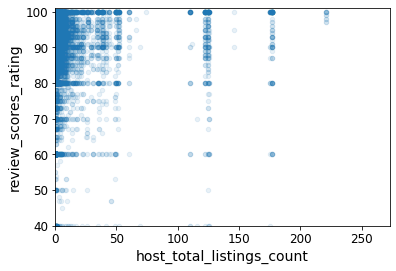

In [100]:
df1.plot(kind="scatter", x="host_total_listings_count", y="review_scores_rating",
             alpha=0.1)
plt.axis([0, 273, 40, 101])
plt.savefig("listing_counts_vs_rating_scatterplot")

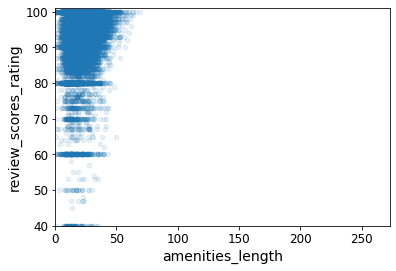

In [101]:
df1.plot(kind="scatter", x="amenities_length", y="review_scores_rating",
             alpha=0.1)
plt.axis([0, 273, 40, 101])
plt.savefig("income_vs_house_value_scatterplot")

In [102]:
df1.describe()

,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_identity_verified,latitude,longitude,accommodates,bedrooms,beds,...,neigbourhood_top_10,flag,host_response_time_indicator,host_response_rate_indicator,host_acceptance_rate_indicator,bedrooms_indicator,description_indicator,beds_indicator,bathrooms_text_indicator,name_indicator
count,2.662800e+04,2.662800e+04,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,...,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.000000,26628.0,26628.0
mean,2.155454e+01,3.312656e+01,0.244179,9.837652,0.808097,40.728428,-73.949712,2.866006,1.296017,1.562282,...,0.461657,0.294277,0.490236,0.490236,0.352974,0.094637,0.017162,0.004845,0.0,0.0
std,9.688831e+03,6.339765e+03,0.429607,80.418748,0.393805,0.055751,0.049463,1.845233,0.736289,1.158847,...,0.498537,0.455725,0.499914,0.499914,0.477904,0.292719,0.129879,0.069435,0.0,0.0
min,-1.580810e+06,-1.034357e+06,0.000000,0.000000,0.000000,40.508680,-74.239860,1.000000,0.502217,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,6.889981e+01,5.434775e+01,0.000000,1.000000,1.000000,40.688250,-73.983072,2.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
50%,8.797556e+01,7.800000e+01,0.000000,1.000000,1.000000,40.723125,-73.954725,2.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
75%,1.000000e+02,9.800000e+01,0.000000,2.000000,1.000000,40.762593,-73.932540,4.000000,1.055631,2.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.0
max,1.091831e+02,1.098492e+02,1.000000,2739.000000,1.000000,40.910780,-73.710870,16.000000,50.412039,42.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,0.0


# ML models